In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

In [2]:
import addict
import matplotlib
import warnings

import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree

from matplotlib.collections import LineCollection

import celeri

# Read data and pre-process

In [3]:
COMMAND_FILE_NAME = "../data/command/japan_command_cmi_coupling.json"
command = celeri.get_command(COMMAND_FILE_NAME)
celeri.create_output_folder(command)
logger = celeri.get_logger(command)
segment, block, meshes, station, mogi, sar = celeri.read_data(command)
station = celeri.process_station(station, command)
segment = celeri.process_segment(segment, command, meshes)
sar = celeri.process_sar(sar, command)
closure, block = celeri.assign_block_labels(segment, station, block, mogi, sar)
assembly = addict.Dict()
operators = addict.Dict()
operators.meshes = [addict.Dict()] * len(meshes)
assembly = celeri.merge_geodetic_data(assembly, station, sar)

INFO: Read: ../data/command/japan_command_cmi_coupling.json - celeri.celeri:get_logger:7560 - 2024-11-20 23:03:48
INFO: RUN_NAME: 0000000564 - celeri.celeri:get_logger:7561 - 2024-11-20 23:03:48
INFO: Write log file: ../runs/0000000564/0000000564.log - celeri.celeri:get_logger:7562 - 2024-11-20 23:03:48
INFO: Reading data files - celeri.celeri:read_data:451 - 2024-11-20 23:03:48
SUCCESS: Read: ../data/segment/qp_japan_segment.csv - celeri.celeri:read_data:455 - 2024-11-20 23:03:48
SUCCESS: Read: ../data/block/japan_block.csv - celeri.celeri:read_data:460 - 2024-11-20 23:03:48
SUCCESS: Read: ../data/mesh/japan_mesh_parameters_cmi_coupling.json - celeri.celeri:read_data:467 - 2024-11-20 23:03:48

SUCCESS: Read: ../data/mesh/nankai.msh - celeri.celeri:read_mesh:446 - 2024-11-20 23:03:48

SUCCESS: Read: ../data/mesh/japan.msh - celeri.celeri:read_mesh:446 - 2024-11-20 23:03:48

SUCCESS: Read: ../data/mesh/sagami.msh - celeri.celeri:read_mesh:446 - 2024-11-20 23:03:48

SUCCESS: Read: ../dat

# Generate all operators, weighting, and data vector for KL+QP problem

In [4]:
# Get all elastic operators for segments and TDEs
celeri.get_elastic_operators(operators, meshes, segment, station, command)

# Get TDE smoothing operators
celeri.get_all_mesh_smoothing_matrices(meshes, operators)

# Block rotation to velocity operator
operators.rotation_to_velocities = celeri.get_rotation_to_velocities_partials(
    station, len(block)
)

# Soft block motion constraints
assembly, operators.block_motion_constraints = celeri.get_block_motion_constraints(
    assembly, block, command
)

# Soft slip rate constraints
assembly, operators.slip_rate_constraints = celeri.get_slip_rate_constraints(
    assembly, segment, block, command
)

# Rotation vectors to slip rate operator
operators.rotation_to_slip_rate = celeri.get_rotation_to_slip_rate_partials(
    segment, block
)

# Internal block strain rate operator
(
    operators.block_strain_rate_to_velocities,
    strain_rate_block_index,
) = celeri.get_block_strain_rate_to_velocities_partials(block, station, segment)

# Mogi source operator
operators.mogi_to_velocities = celeri.get_mogi_to_velocities_partials(
    mogi, station, command
)

# Soft TDE boundary condition constraints
celeri.get_tde_slip_rate_constraints(meshes, operators)

# Get index
index = celeri.get_index_eigen(assembly, segment, station, block, meshes, mogi)

# Get data vector for KL problem
data_vector_eigen = celeri.get_data_vector_eigen(meshes, assembly, index)

# Get data vector for KL problem
weighting_vector_eigen = celeri.get_weighting_vector_eigen(
    command, station, meshes, index
)

# Get KL modes for each mesh
celeri.get_eigenvectors_to_tde_slip(operators, meshes)

# Get full operator including all blocks, KL modes, strain blocks, and mogis
operators.eigen = celeri.get_full_dense_operator_eigen(operators, meshes, index)

# Get rotation to TDE kinematic slip rate operator for all meshes tied to segments
celeri.get_tde_coupling_constraints(meshes, segment, block, operators)

INFO: Computing elastic operators - celeri.celeri:get_elastic_operators:2053 - 2024-11-20 23:03:48


Calculating Okada partials for segments: 100%|██████████| 481/481 [00:04<00:00, 110.72it/s]


INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-20 23:03:53


Calculating cutde partials for triangles: 100%|██████████| 1902/1902 [00:05<00:00, 321.12it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-20 23:03:59
INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/japan.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-20 23:03:59


Calculating cutde partials for triangles: 100%|██████████| 2621/2621 [00:07<00:00, 345.36it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/japan.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-20 23:04:06
INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/sagami.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-20 23:04:06


Calculating cutde partials for triangles: 100%|██████████| 231/231 [00:00<00:00, 354.22it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/sagami.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-20 23:04:07
INFO: Start: TDE slip to velocity calculation for mesh: ../data/mesh/japan_mock_cmi.msh - celeri.celeri:get_elastic_operators:2061 - 2024-11-20 23:04:07


Calculating cutde partials for triangles: 100%|██████████| 76/76 [00:00<00:00, 356.79it/s]


SUCCESS: Finish: TDE slip to velocity calculation for mesh: ../data/mesh/japan_mock_cmi.msh - celeri.celeri:get_elastic_operators:2067 - 2024-11-20 23:04:07
INFO: No slip rate constraints - celeri.celeri:get_slip_rate_constraints:3356 - 2024-11-20 23:04:08
INFO: Start: Eigenvectors to TDE slip for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4456 - 2024-11-20 23:04:08
SUCCESS: Finish: Eigenvectors to TDE slip for mesh: ../data/mesh/nankai.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4485 - 2024-11-20 23:04:09
INFO: Start: Eigenvectors to TDE slip for mesh: ../data/mesh/japan.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4456 - 2024-11-20 23:04:09
SUCCESS: Finish: Eigenvectors to TDE slip for mesh: ../data/mesh/japan.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4485 - 2024-11-20 23:04:11
INFO: Start: Eigenvectors to TDE slip for mesh: ../data/mesh/sagami.msh - celeri.celeri:get_eigenvectors_to_tde_slip:4456 - 2024-11-20 23:04:11
SUCCESS: Finish: 

# Solve bounded KL+QP problem

In [5]:
# Get QP bounds as inequality constraints
qp_inequality_constraints_matrix, qp_inequality_constraints_data_vector = (
    celeri.get_qp_all_inequality_operator_and_data_vector(
        index, meshes, operators, segment, block
    )
)

# QP solve
opts = {"show_progress": True}
solution_qp = celeri.lsqlin_qp(
    operators.eigen * np.sqrt(weighting_vector_eigen[:, None]),
    data_vector_eigen * np.sqrt(weighting_vector_eigen),
    0,
    qp_inequality_constraints_matrix,  # Inequality matrix
    qp_inequality_constraints_data_vector,  # Inequality data vector
    None,
    None,
    None,
    None,
    None,
    opts,
)


# Create estimation data structure and calculate derived quantities
estimation_qp = addict.Dict()
estimation_qp.state_vector = np.array(solution_qp["x"]).flatten()
estimation_qp.operator = operators.eigen
celeri.post_process_estimation_eigen(estimation_qp, operators, station, index)
celeri.write_output(command, estimation_qp, station, segment, block, meshes)

INFO: No hard slip rate bounds - celeri.celeri:get_slip_rate_bounds:4153 - 2024-11-20 23:04:11
     pcost       dcost       gap    pres   dres
 0: -2.9918e+04 -3.4698e+07  3e+07  2e-17  2e-15
 1: -4.4283e+04 -8.3736e+06  8e+06  3e-16  1e-15
 2: -4.4008e+04 -7.9965e+06  8e+06  3e-16  8e-16
 3: -4.4315e+04 -1.4707e+06  1e+06  3e-16  5e-16
 4: -4.6935e+04 -2.3546e+05  2e+05  3e-16  5e-16
 5: -4.9022e+04 -7.2078e+04  2e+04  3e-16  6e-16
 6: -5.0030e+04 -5.3424e+04  3e+03  3e-16  7e-16
 7: -5.0323e+04 -5.1166e+04  8e+02  3e-16  9e-16
 8: -5.0407e+04 -5.0735e+04  3e+02  3e-16  6e-16
 9: -5.0426e+04 -5.0647e+04  2e+02  3e-16  7e-16
10: -5.0439e+04 -5.0550e+04  1e+02  3e-16  5e-16
11: -5.0441e+04 -5.0521e+04  8e+01  3e-16  6e-16
12: -5.0444e+04 -5.0485e+04  4e+01  3e-16  6e-16
13: -5.0445e+04 -5.0463e+04  2e+01  3e-16  6e-16
14: -5.0445e+04 -5.0455e+04  1e+01  3e-16  5e-16
15: -5.0446e+04 -5.0450e+04  5e+00  3e-16  6e-16
16: -5.0446e+04 -5.0448e+04  2e+00  3e-16  5e-16
17: -5.0446e+04 -5.0447e

# Plot KL+QP estimation

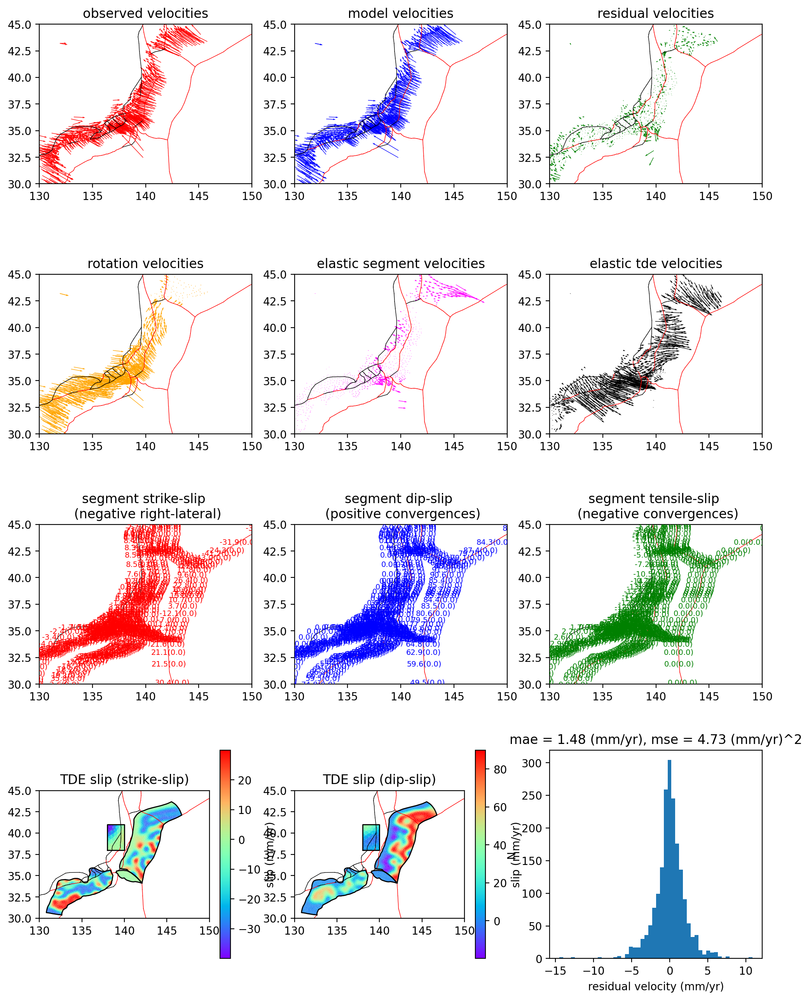

SUCCESS: Wrote figures../runs/0000000564/plot_estimation_summary.(pdf, png) - celeri.celeri:plot_estimation_summary:6601 - 2024-11-20 23:04:17


<Figure size 640x480 with 0 Axes>

In [6]:
celeri.plot_estimation_summary(
    command,
    segment,
    station,
    meshes,
    estimation_qp,
    lon_range=command.lon_range,
    lat_range=command.lat_range,
    quiver_scale=command.quiver_scale,
)

In [7]:
len(estimation_qp.state_vector)

# Multiply rotation vector components by TDE slip rate partials
jpl = (
    operators.rotation_to_tri_slip_rate[0]
    @ estimation_qp.state_vector[0 : 3 * len(block)]
)

# Multiply eigen modes by eigen to TDE matrix

bjm = (
    operators.eigenvectors_to_tde_slip[0]
    @ estimation_qp.state_vector[
        3 * len(block) : 3 * len(block)
        + (meshes[0].n_modes_strike_slip + meshes[0].n_modes_dip_slip)
    ]
)


def plot_mesh(meshes, fill_value, ax):
    x_coords = meshes.points[:, 0]
    y_coords = meshes.points[:, 1]
    vertex_array = np.asarray(meshes.verts)

    if not ax:
        ax = plt.gca()
    xy = np.c_[x_coords, y_coords]
    verts = xy[vertex_array]
    pc = matplotlib.collections.PolyCollection(verts, edgecolor="none", cmap="rainbow")
    pc.set_array(fill_value)
    ax.add_collection(pc)
    ax.autoscale()
    plt.colorbar(pc)

    # Add mesh edge
    x_edge = x_coords[meshes.ordered_edge_nodes[:, 0]]
    y_edge = y_coords[meshes.ordered_edge_nodes[:, 0]]
    x_edge = np.append(x_edge, x_coords[meshes.ordered_edge_nodes[0, 0]])
    y_edge = np.append(y_edge, y_coords[meshes.ordered_edge_nodes[0, 0]])
    plt.plot(x_edge, y_edge, color="black", linewidth=1)
    plt.gca().set_aspect("equal")

# Correct coupling calculation

In [8]:
def smooth_irregular_data(x_coords, y_coords, values, length_scale):
    # Build a KDTree for efficient neighbor searching
    points = np.vstack((x_coords, y_coords)).T
    tree = cKDTree(points)

    # Prepare an array to store the smoothed values
    smoothed_values = np.zeros_like(values)

    # Smoothing calculation
    for i, point in enumerate(points):
        # Find neighbors within 3 * length_scale for efficiency
        indices = tree.query_ball_point(point, 3 * length_scale)

        # Calculate distances and apply Gaussian weights
        distances = np.linalg.norm(points[indices] - point, axis=1)
        weights = np.exp(-(distances**2) / (2 * length_scale**2))

        # Weighted sum for smoothing
        smoothed_values[i] = np.sum(weights * values[indices]) / np.sum(weights)

    return smoothed_values


def colored_line_between_pts(x, y, c, ax, **lc_kwargs):
    """
    Plot a line with a color specified between (x, y) points by a third value.

    It does this by creating a collection of line segments between each pair of
    neighboring points. The color of each segment is determined by the
    made up of two straight lines each connecting the current (x, y) point to the
    midpoints of the lines connecting the current point with its two neighbors.
    This creates a smooth line with no gaps between the line segments.

    Parameters
    ----------
    x, y : array-like
        The horizontal and vertical coordinates of the data points.
    c : array-like
        The color values, which should have a size one less than that of x and y.
    ax : Axes
        Axis object on which to plot the colored line.
    **lc_kwargs
        Any additional arguments to pass to matplotlib.collections.LineCollection
        constructor. This should not include the array keyword argument because
        that is set to the color argument. If provided, it will be overridden.

    Returns
    -------
    matplotlib.collections.LineCollection
        The generated line collection representing the colored line.
    """
    if "array" in lc_kwargs:
        warnings.warn('The provided "array" keyword argument will be overridden')

    # Check color array size (LineCollection still works, but values are unused)
    if len(c) != len(x) - 1:
        warnings.warn(
            "The c argument should have a length one less than the length of x and y. "
            "If it has the same length, use the colored_line function instead."
        )

    # Create a set of line segments so that we can color them individually
    # This creates the points as an N x 1 x 2 array so that we can stack points
    # together easily to get the segments. The segments array for line collection
    # needs to be (numlines) x (points per line) x 2 (for x and y)
    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1], points[1:]], axis=1)
    lc = LineCollection(segments, **lc_kwargs)

    # Set the values used for colormapping
    lc.set_array(c)

    return ax.add_collection(lc)


# Smooth kinematic smooth
jpl_ss_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[0::2], length_scale=0.01
)

jpl_ds_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[1::2], length_scale=0.01
)

coupling_ss = bjm[0::2] / jpl_ss_smooth

# Iterative approach to finding a solution within coupling bounds

In [9]:
def check_coupling_bounds_single_mesh(
    meshes,
    mesh_idx,
    estimation_qp,
    current_ss_bounds_lower,
    current_ss_bounds_upper,
    current_ds_bounds_lower,
    current_ds_bounds_upper,
    debug_plot=False,
):
    """
    *mesh_parameter.json variable names for reference:

    TDE rate bounds:
    "qp_mesh_tde_bound": 1,
    "qp_mesh_tde_slip_rate_lower_bound_ss": -30,
    "qp_mesh_tde_slip_rate_upper_bound_ss": 30,
    "qp_mesh_tde_slip_rate_lower_bound_ds": 0,
    "qp_mesh_tde_slip_rate_upper_bound_ds": 60,

    TDE coupling bounds:
    "qp_mesh_tde_bound_coupling": 0,
    "qp_mesh_tde_slip_rate_lower_bound_ss_coupling": -0.5,
    "qp_mesh_tde_slip_rate_upper_bound_ss_coupling": 0.5,
    "qp_mesh_tde_slip_rate_lower_bound_ds_coupling": 0,
    "qp_mesh_tde_slip_rate_upper_bound_ds_coupling": 1,
    """

    # Multiply rotation vector components by TDE slip rate partials
    kinematic_tde_rates = (
        operators.rotation_to_tri_slip_rate[mesh_idx]
        @ estimation_qp.state_vector[0 : 3 * len(block)]
    )

    # Multiply eigen modes by eigen to TDE matrix
    estimated_tde_rates = (
        operators.eigenvectors_to_tde_slip[mesh_idx]
        @ estimation_qp.state_vector[
            3 * len(block) : 3 * len(block)
            + (meshes[mesh_idx].n_modes_strike_slip + meshes[mesh_idx].n_modes_dip_slip)
        ]  # TODO: Fix column indexing
    )

    # Smooth kinematic rates
    SMOOTHING_LENGTH_SCALE = 0.5
    kinematic_tde_rates_ss_smooth = smooth_irregular_data(
        meshes[mesh_idx].lon_centroid,
        meshes[mesh_idx].lat_centroid,
        kinematic_tde_rates[0::2],
        length_scale=SMOOTHING_LENGTH_SCALE,
    )
    kinematic_tde_rates_ds_smooth = smooth_irregular_data(
        meshes[mesh_idx].lon_centroid,
        meshes[mesh_idx].lat_centroid,
        kinematic_tde_rates[1::2],
        length_scale=SMOOTHING_LENGTH_SCALE,
    )

    # Set the minimum value of the kinematic rates
    # The purpose of this is to prevent coupling blow up as the kinematic
    # rates approach zero

    # TODO: I think the problem might be here

    MINIMUM_KINEMATIC_VELOCITY = 1.0  # mm/yr
    kinematic_tde_rates_ss_smooth[
        np.abs(kinematic_tde_rates_ss_smooth) < MINIMUM_KINEMATIC_VELOCITY
    ] = MINIMUM_KINEMATIC_VELOCITY * np.sign(
        kinematic_tde_rates_ss_smooth[
            np.abs(kinematic_tde_rates_ss_smooth) < MINIMUM_KINEMATIC_VELOCITY
        ]
    )

    kinematic_tde_rates_ds_smooth[
        np.abs(kinematic_tde_rates_ds_smooth) < MINIMUM_KINEMATIC_VELOCITY
    ] = MINIMUM_KINEMATIC_VELOCITY * np.sign(
        kinematic_tde_rates_ds_smooth[
            np.abs(kinematic_tde_rates_ds_smooth) < MINIMUM_KINEMATIC_VELOCITY
        ]
    )
    tde_coupling_ss = estimated_tde_rates[0::2] / kinematic_tde_rates_ss_smooth
    tde_coupling_ds = estimated_tde_rates[1::2] / kinematic_tde_rates_ds_smooth

    tde_coupling_ss = estimated_tde_rates[0::2] / np.abs(kinematic_tde_rates_ss_smooth)
    tde_coupling_ds = estimated_tde_rates[1::2] / np.abs(kinematic_tde_rates_ds_smooth)

    plt.figure(figsize=(20, 4))
    plt.plot(kinematic_tde_rates_ss_smooth, tde_coupling_ss, "r.")
    # plt.plot(np.sort(kinematic_tde_rates_ss_smooth))
    plt.show()

    # Find indices of TDEs with out of bound coupling values
    # tde_coupling_ss_lower_oob_idx = np.where(
    #     tde_coupling_ss < meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ss_coupling
    # )[0]

    # tde_coupling_ss_upper_oob_idx = np.where(
    #     tde_coupling_ss > meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ss_coupling
    # )[0]

    # tde_coupling_ds_lower_oob_idx = np.where(
    #     tde_coupling_ds < meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ds_coupling
    # )[0]

    # tde_coupling_ds_upper_oob_idx = np.where(
    #     tde_coupling_ss > meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ds_coupling
    # )[0]

    # Try working through this all over again
    tde_coupling_ss_lower_oob_idx = np.where(
        tde_coupling_ss < meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ss_coupling
    )[0]

    tde_coupling_ss_upper_oob_idx = np.where(
        tde_coupling_ss > meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ss_coupling
    )[0]

    tde_coupling_ds_lower_oob_idx = np.where(
        tde_coupling_ds < meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ds_coupling
    )[0]

    tde_coupling_ds_upper_oob_idx = np.where(
        tde_coupling_ss > meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ds_coupling
    )[0]

    # Make vectors for update slip rates (not neccesary but useful for debugging)
    updated_ss_bounds_lower = np.copy(current_ss_bounds_lower)
    updated_ss_bounds_upper = np.copy(current_ss_bounds_upper)
    updated_ds_bounds_lower = np.copy(current_ds_bounds_lower)
    updated_ds_bounds_upper = np.copy(current_ds_bounds_upper)

    # Update slip rate bounds
    SLIP_RATE_REDUCTION_FACTOR = 0.90
    updated_ss_bounds_lower[tde_coupling_ss_lower_oob_idx] *= SLIP_RATE_REDUCTION_FACTOR
    updated_ss_bounds_upper[tde_coupling_ss_upper_oob_idx] *= SLIP_RATE_REDUCTION_FACTOR
    updated_ds_bounds_lower[tde_coupling_ds_lower_oob_idx] *= SLIP_RATE_REDUCTION_FACTOR
    updated_ds_bounds_upper[tde_coupling_ds_upper_oob_idx] *= SLIP_RATE_REDUCTION_FACTOR

    # updated_ss_bounds_lower[tde_coupling_ss_lower_oob_idx] += 3.0
    # updated_ss_bounds_upper[tde_coupling_ss_upper_oob_idx] += -3.0
    # updated_ds_bounds_lower[tde_coupling_ds_lower_oob_idx] += 3.0
    # updated_ds_bounds_upper[tde_coupling_ds_upper_oob_idx] += -3.0

    # Total number of OOB coupling constraints
    n_oob = (
        len(tde_coupling_ss_lower_oob_idx)
        + len(tde_coupling_ss_upper_oob_idx)
        + len(tde_coupling_ds_lower_oob_idx)
        + len(tde_coupling_ds_upper_oob_idx)
    )

    # Report on OOB cases
    logger.info(
        f"SS TDE COUPLING BOUNDS FOR MESH {mesh_idx}, min={meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ss_coupling}, max={meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ss_coupling}"
    )
    logger.info(
        f"DS TDE COUPLING BOUNDS FOR MESH {mesh_idx}, min={meshes[mesh_idx].qp_mesh_tde_slip_rate_lower_bound_ds_coupling}, max={meshes[mesh_idx].qp_mesh_tde_slip_rate_upper_bound_ds_coupling}"
    )

    # Report the number and type of coupling OOB
    logger.info(
        f"MIN SS TDE COUPLING BOUNDS FOR MESH {0}, OOB AT {len(tde_coupling_ss_lower_oob_idx)} TDEs"
    )
    logger.info(
        f"MAX SS TDE COUPLING BOUNDS FOR MESH {0}, OOB AT {len(tde_coupling_ss_upper_oob_idx)} TDEs"
    )
    logger.info(
        f"MIN DS TDE COUPLING BOUNDS FOR MESH {0}, OOB AT {len(tde_coupling_ds_lower_oob_idx)} TDEs"
    )
    logger.info(
        f"MAX DS TDE COUPLING BOUNDS FOR MESH {0}, OOB AT {len(tde_coupling_ds_upper_oob_idx)} TDEs"
    )
    logger.info(f"TOTAL TDES OOB {n_oob} TDEs")

    # Determine whether or not updating is required
    if n_oob > 0:
        continue_iterate_for_coupling_bounds = True
    else:
        continue_iterate_for_coupling_bounds = False
    logger.info(
        f"CONTINUE COUPLING RELAXATION ITERATION: {continue_iterate_for_coupling_bounds}"
    )

    if debug_plot == True:
        # Plot locations of TDEs with out of bound coupling values
        plt.figure(figsize=(11, 5))
        plt.subplot(1, 2, 1)
        plot_mesh(meshes[mesh_idx], tde_coupling_ss, plt.gca())
        plt.plot(
            meshes[mesh_idx].lon_centroid[tde_coupling_ss_lower_oob_idx],
            meshes[mesh_idx].lat_centroid[tde_coupling_ss_lower_oob_idx],
            "k+",
            label="below min",
        )
        plt.plot(
            meshes[mesh_idx].lon_centroid[tde_coupling_ss_upper_oob_idx],
            meshes[mesh_idx].lat_centroid[tde_coupling_ss_upper_oob_idx],
            "g+",
            label="above max",
        )
        plt.legend()
        plt.title("strike-slip coupling oob")

        plt.subplot(1, 2, 2)
        plot_mesh(meshes[mesh_idx], tde_coupling_ds, plt.gca())
        plt.plot(
            meshes[mesh_idx].lon_centroid[tde_coupling_ds_lower_oob_idx],
            meshes[mesh_idx].lat_centroid[tde_coupling_ds_lower_oob_idx],
            "bx",
            label="below min",
        )
        plt.plot(
            meshes[mesh_idx].lon_centroid[tde_coupling_ds_upper_oob_idx],
            meshes[mesh_idx].lat_centroid[tde_coupling_ds_upper_oob_idx],
            "g+",
            label="above max",
        )
        plt.legend()
        plt.title("dip-slip coupling oob")
        plt.show()

        # Plot adjusted bounds on mesh
        plt.figure(figsize=(20, 5))
        plt.subplot(1, 4, 1)
        plot_mesh(meshes[mesh_idx], updated_ss_bounds_lower, plt.gca())
        plt.title("ss adjusted lower bounds")
        plt.subplot(1, 4, 2)
        plot_mesh(meshes[mesh_idx], updated_ss_bounds_upper, plt.gca())
        plt.title("ss adjusted upper bounds")
        plt.subplot(1, 4, 3)
        plot_mesh(meshes[mesh_idx], updated_ds_bounds_lower, plt.gca())
        plt.title("ds adjusted lower bounds")
        plt.subplot(1, 4, 4)
        plot_mesh(meshes[mesh_idx], updated_ds_bounds_upper, plt.gca())
        plt.title("ds adjusted upper bounds")
        plt.show()

    return (
        continue_iterate_for_coupling_bounds,
        updated_ss_bounds_lower,
        updated_ss_bounds_upper,
        updated_ds_bounds_lower,
        updated_ds_bounds_upper,
        kinematic_tde_rates_ss_smooth,
        kinematic_tde_rates_ds_smooth,
        estimated_tde_rates[0::2],
        estimated_tde_rates[1::2],
        n_oob,
    )

INFO: 
ITERATION 0 - __main__:<module>:53 - 2024-11-20 23:04:17


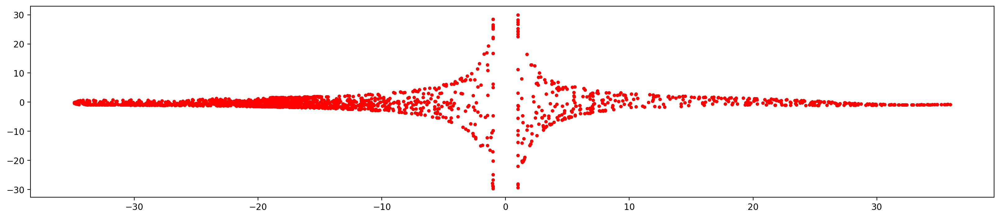

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:17
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:17
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 996 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:17
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 477 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:17
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:17
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 356 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:17
INFO: TOTAL TDES OOB 1829 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:17
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:0

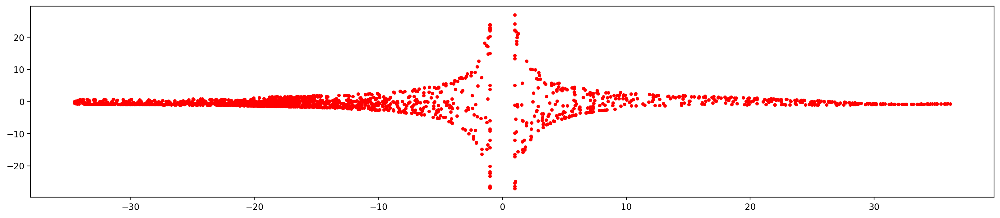

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:19
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:19
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1052 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:19
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 411 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:19
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:19
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 290 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:19
INFO: TOTAL TDES OOB 1753 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:19
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:

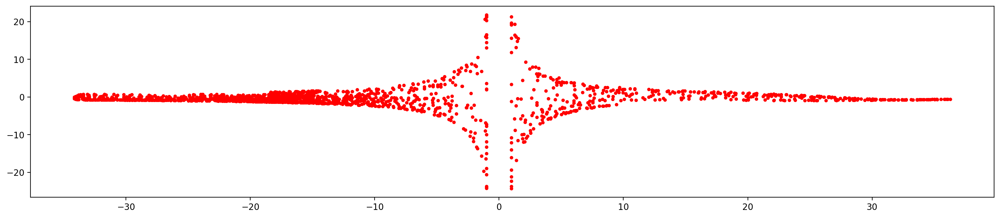

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:20
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:20
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1087 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:20
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 366 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:20
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:20
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 253 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:20
INFO: TOTAL TDES OOB 1706 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:20
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:

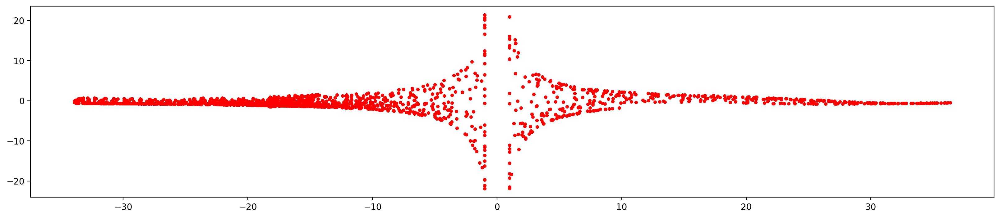

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:21
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:21
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1135 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:21
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 342 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:21
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:21
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 227 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:21
INFO: TOTAL TDES OOB 1704 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:21
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:

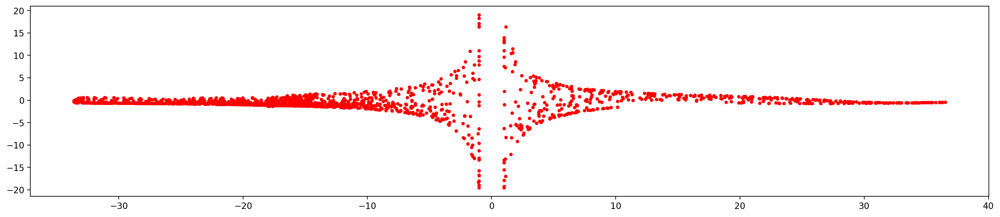

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:23
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:23
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1177 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:23
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 308 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:23
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:23
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 211 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:23
INFO: TOTAL TDES OOB 1696 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:23
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:

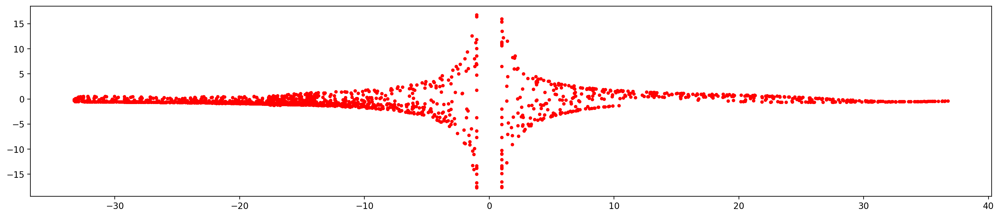

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:24
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:24
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1188 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:24
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 307 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:24
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:24
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 202 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:24
INFO: TOTAL TDES OOB 1697 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:24
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:

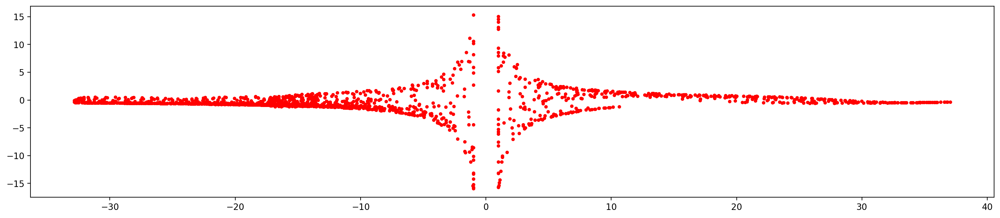

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:25
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:25
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1141 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:25
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 334 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:25
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:25
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 199 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:25
INFO: TOTAL TDES OOB 1674 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:25
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:

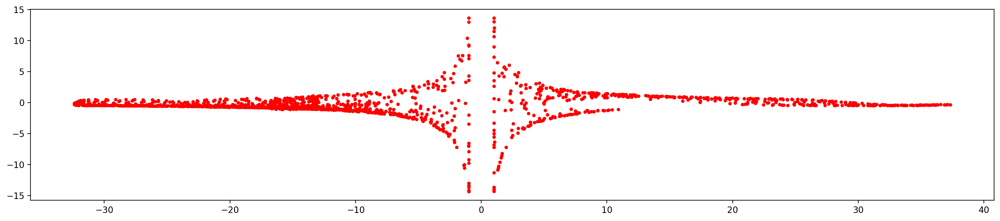

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:27
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:27
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1064 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:27
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 344 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:27
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:27
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 196 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:27
INFO: TOTAL TDES OOB 1604 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:27
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:

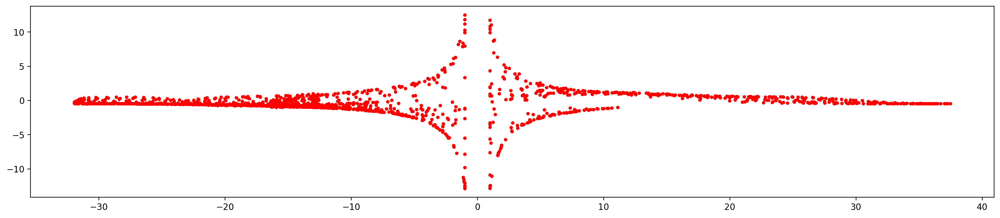

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:28
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:28
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1002 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:28
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 345 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:28
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:28
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 191 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:28
INFO: TOTAL TDES OOB 1538 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:28
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:

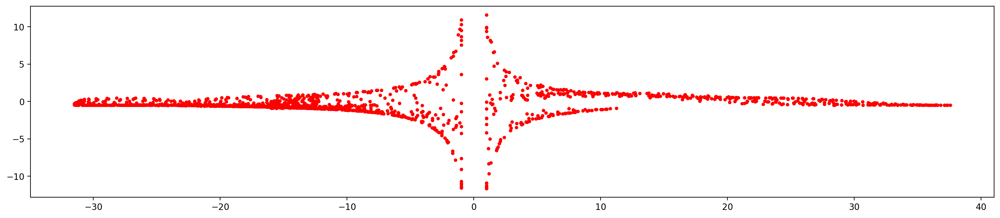

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:29
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:29
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 952 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:29
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 321 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:29
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:29
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 165 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:29
INFO: TOTAL TDES OOB 1438 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:29
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:0

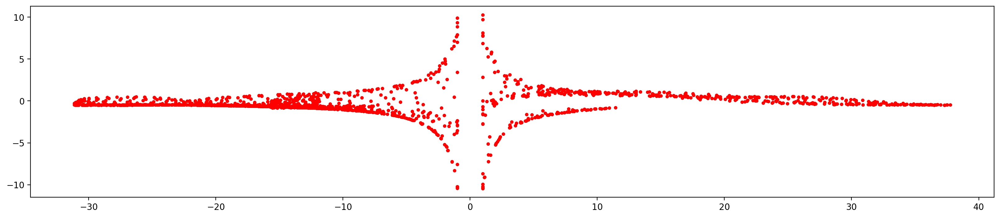

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:31
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:31
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 923 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:31
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 309 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:31
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:31
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 137 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:31
INFO: TOTAL TDES OOB 1369 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:31
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:0

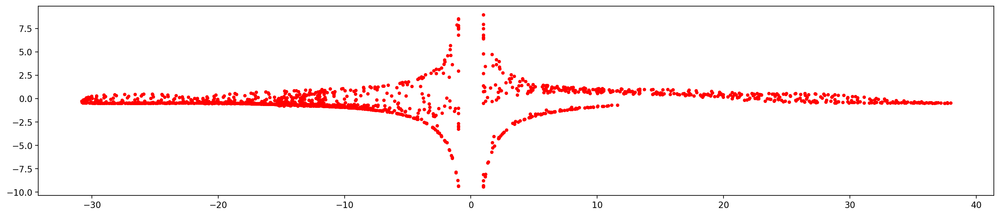

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:32
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:32
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 838 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:32
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 313 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:32
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:32
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 137 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:32
INFO: TOTAL TDES OOB 1288 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:32
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:0

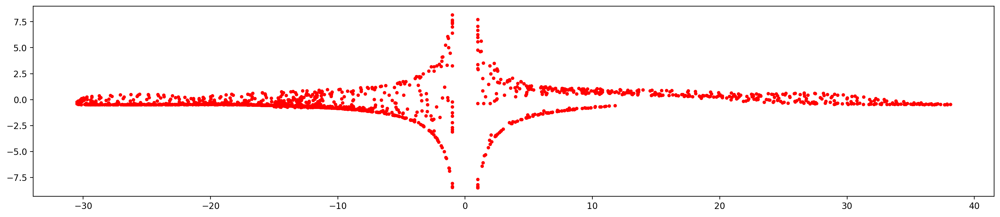

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:33
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:33
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 710 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:33
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 298 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:33
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:33
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 130 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:33
INFO: TOTAL TDES OOB 1138 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:33
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:0

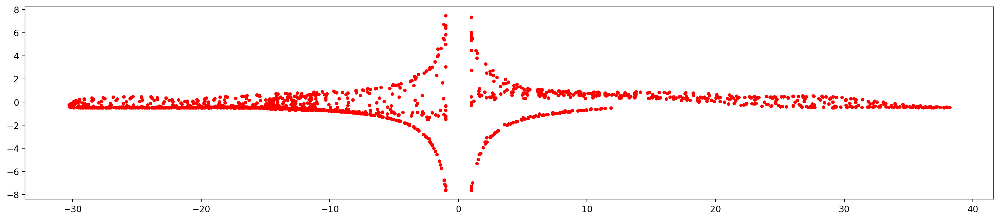

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:35
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:35
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 608 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:35
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 267 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:35
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:35
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 91 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:35
INFO: TOTAL TDES OOB 966 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:35
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:

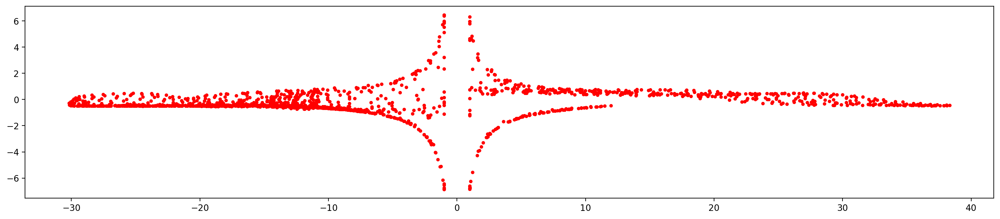

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:36
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:36
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 510 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:36
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 249 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:36
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:36
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 75 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:36
INFO: TOTAL TDES OOB 834 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:36
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:

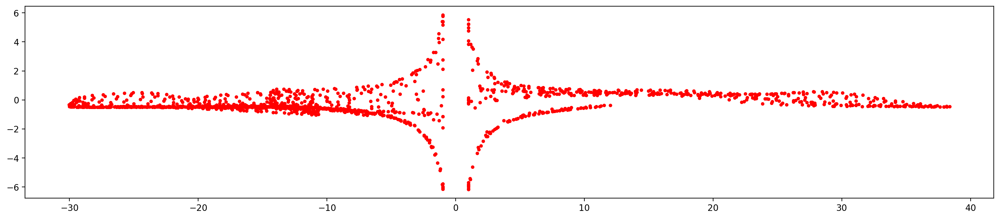

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:37
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:37
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 473 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:37
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 221 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:37
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:37
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 65 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:37
INFO: TOTAL TDES OOB 759 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:37
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:

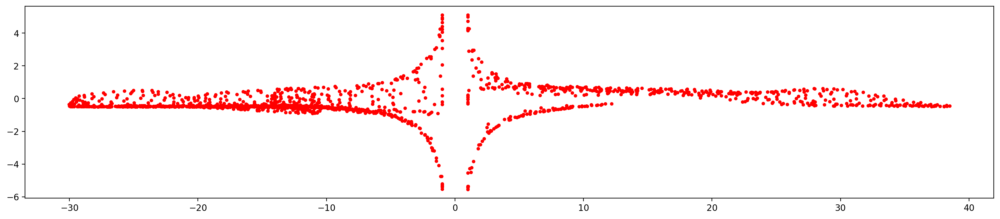

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:39
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:39
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 415 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:39
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 235 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:39
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:39
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 70 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:39
INFO: TOTAL TDES OOB 720 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:39
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:

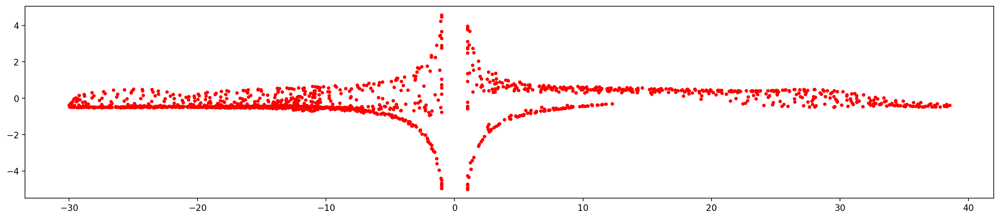

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:40
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:40
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 405 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:40
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 201 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:40
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:40
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 53 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:40
INFO: TOTAL TDES OOB 659 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:40
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:

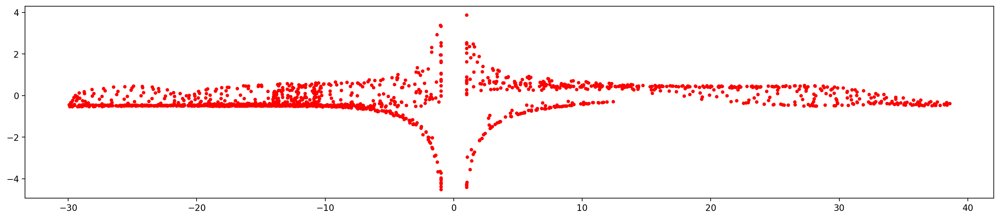

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:41
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:41
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 239 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:41
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 166 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:41
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:41
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 40 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:41
INFO: TOTAL TDES OOB 445 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:41
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:

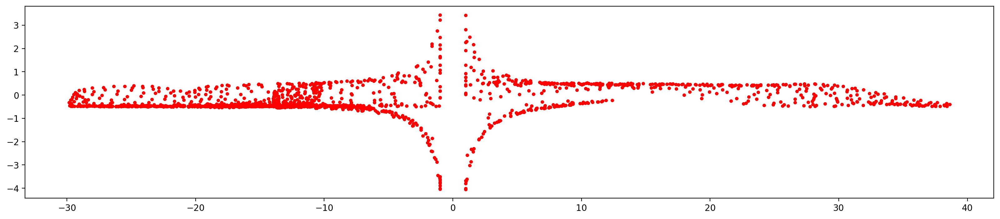

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:42
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:42
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 224 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:42
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 143 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:42
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:42
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 33 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:42
INFO: TOTAL TDES OOB 400 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:42
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:

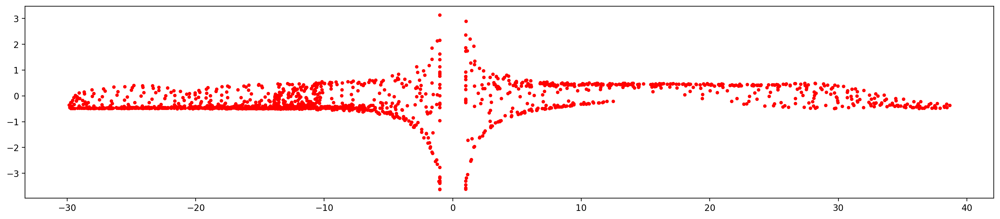

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:44
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:44
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 164 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:44
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 92 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:44
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:44
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 21 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:44
INFO: TOTAL TDES OOB 277 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:44
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:4

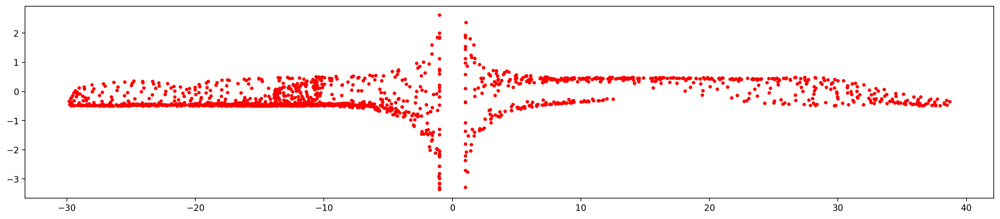

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:45
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:45
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 150 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:45
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 65 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:45
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:45
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 20 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:45
INFO: TOTAL TDES OOB 235 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:45
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:4

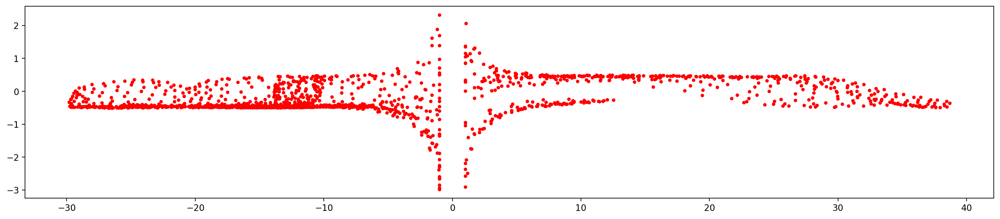

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:47
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:47
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 135 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:47
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 52 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:47
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:47
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 16 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:47
INFO: TOTAL TDES OOB 203 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:47
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:4

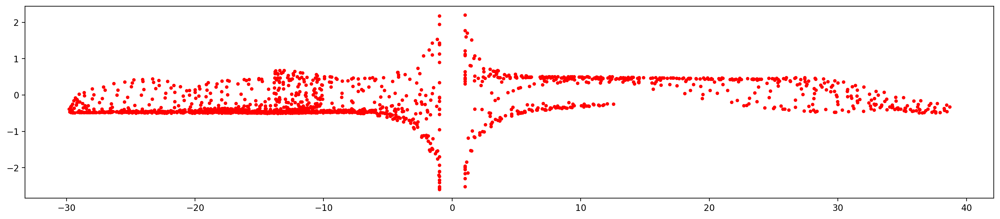

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:48
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:48
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 115 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:48
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 94 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:48
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:48
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 20 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:48
INFO: TOTAL TDES OOB 229 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:48
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:4

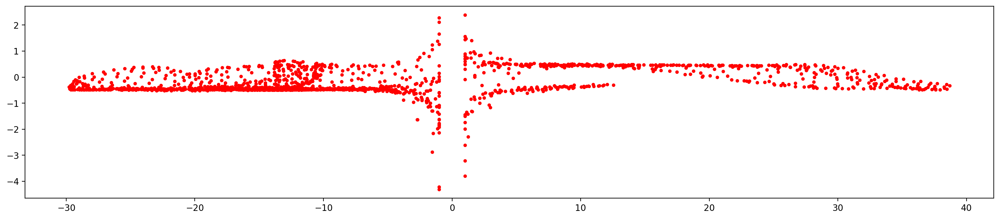

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:49
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:49
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 126 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:49
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 78 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:49
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:49
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 12 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:49
INFO: TOTAL TDES OOB 216 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:49
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:4

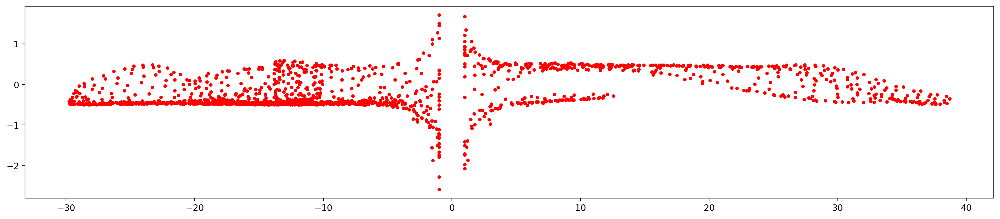

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:51
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:51
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 97 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:51
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 80 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:51
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:51
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 11 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:51
INFO: TOTAL TDES OOB 188 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:51
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:51

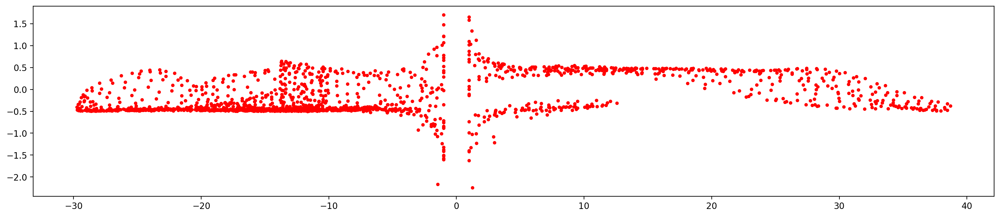

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:52
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:52
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 75 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:52
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 86 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:52
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:52
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 13 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:52
INFO: TOTAL TDES OOB 174 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:52
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:52

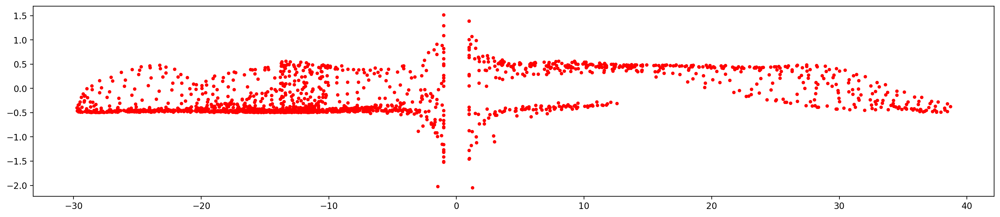

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:53
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:53
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 67 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:53
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 83 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:53
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:53
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 7 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:53
INFO: TOTAL TDES OOB 157 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:53
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:53


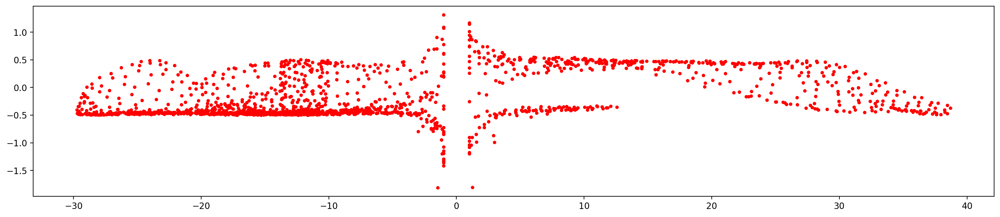

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:55
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:55
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 63 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:55
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 74 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:55
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:55
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 6 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:55
INFO: TOTAL TDES OOB 143 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:55
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:55


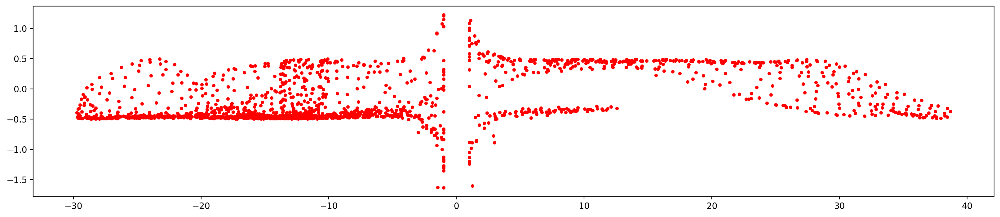

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:56
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:56
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 54 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:56
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 43 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:56
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:56
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 8 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:56
INFO: TOTAL TDES OOB 105 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:56
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:56


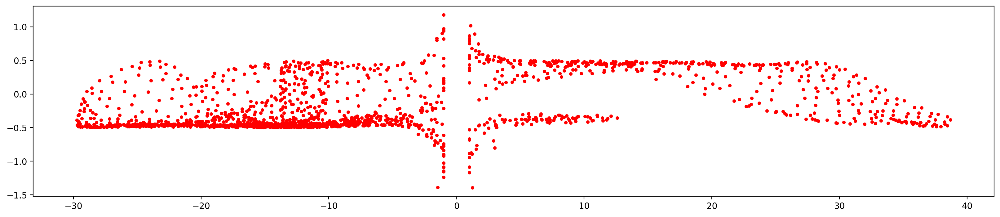

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:57
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:57
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 49 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:57
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 41 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:57
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:57
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 2 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:57
INFO: TOTAL TDES OOB 92 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:57
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:57
I

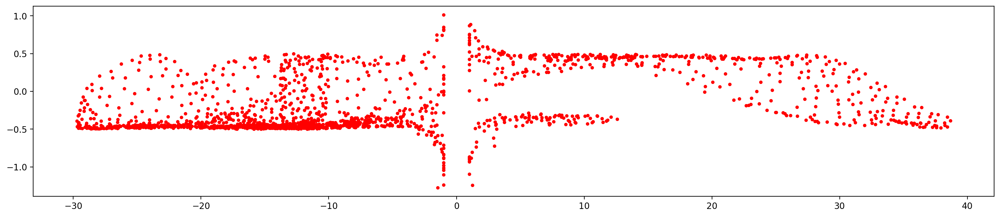

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:04:59
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:04:59
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 47 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:04:59
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 30 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:04:59
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:04:59
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:04:59
INFO: TOTAL TDES OOB 78 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:04:59
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:04:59
I

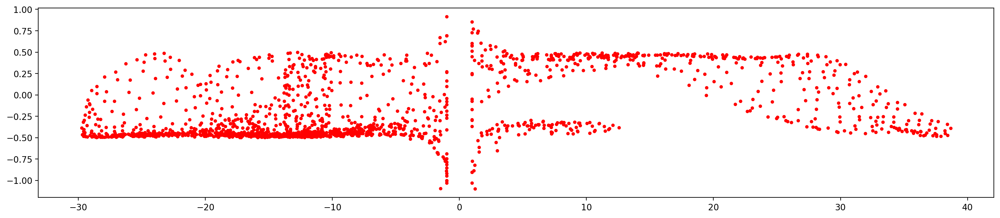

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:00
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:00
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 41 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:00
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 23 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:00
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:00
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:00
INFO: TOTAL TDES OOB 64 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:00
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:00
I

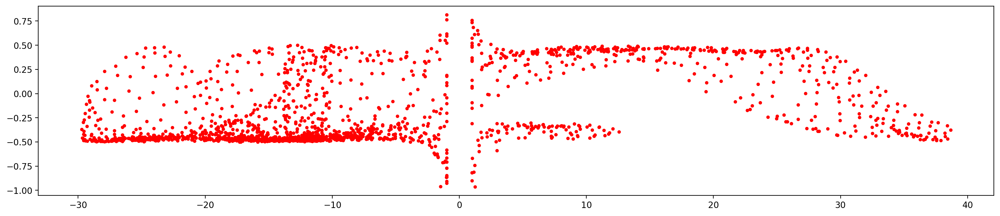

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:01
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:01
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 37 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:01
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 20 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:01
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:01
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:01
INFO: TOTAL TDES OOB 57 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:01
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:01
I

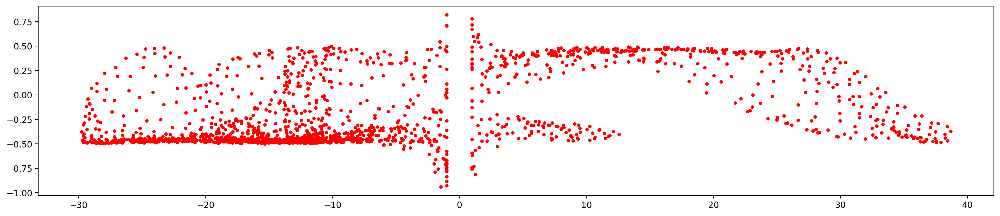

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:03
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:03
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 42 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:03
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 13 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:03
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:03
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:03
INFO: TOTAL TDES OOB 55 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:03
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:03
I

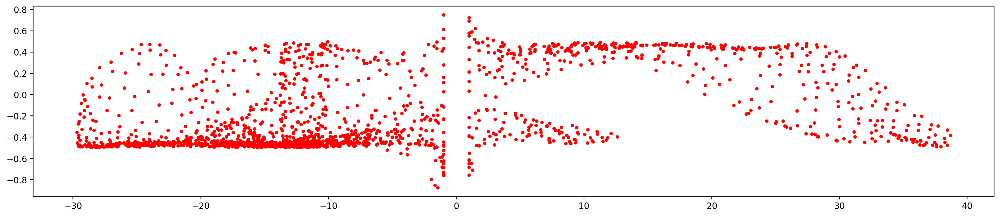

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:04
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:04
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 31 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:04
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 13 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:04
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:04
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:04
INFO: TOTAL TDES OOB 44 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:04
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:04
I

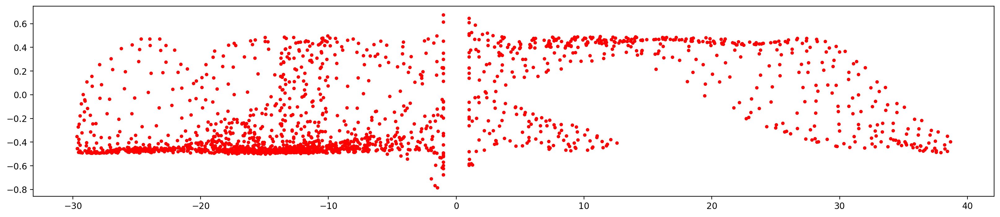

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:06
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:06
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 22 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:06
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 10 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:06
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:06
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:06
INFO: TOTAL TDES OOB 32 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:06
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:06
I

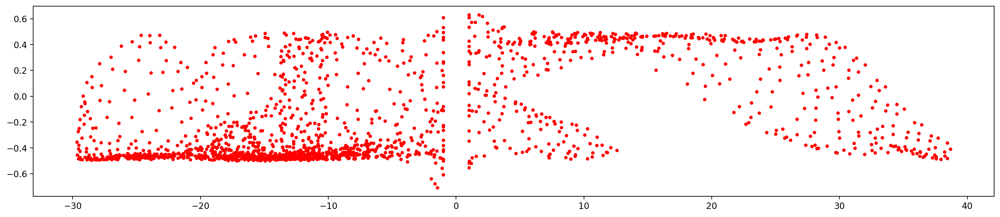

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:07
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:07
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 13 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:07
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 16 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:07
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:07
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:07
INFO: TOTAL TDES OOB 29 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:07
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:07
I

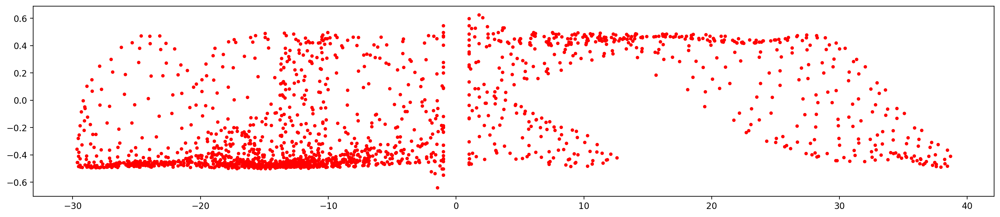

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:09
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:09
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 7 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:09
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 11 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:09
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:09
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:09
INFO: TOTAL TDES OOB 18 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:09
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:09
IN

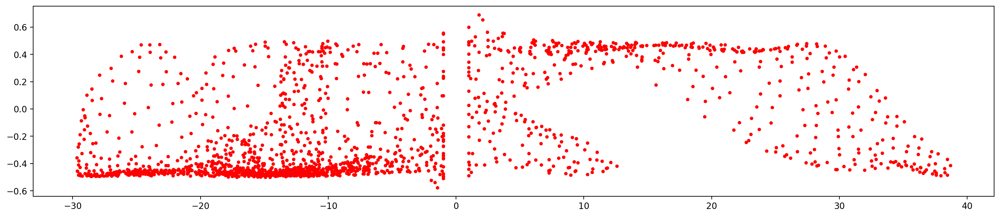

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:10
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:10
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 4 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:10
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 14 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:10
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:10
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:10
INFO: TOTAL TDES OOB 18 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:10
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:10
IN

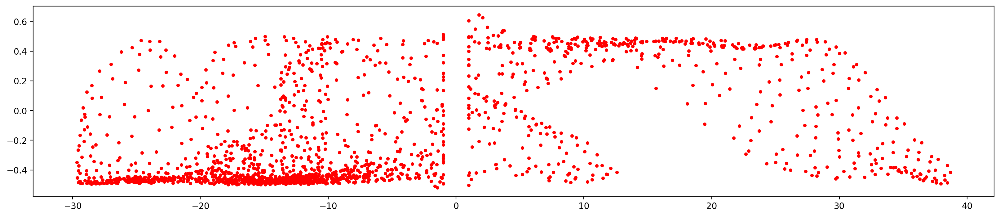

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:11
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:11
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 3 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:11
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 11 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:11
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:11
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:11
INFO: TOTAL TDES OOB 14 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:11
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:11
IN

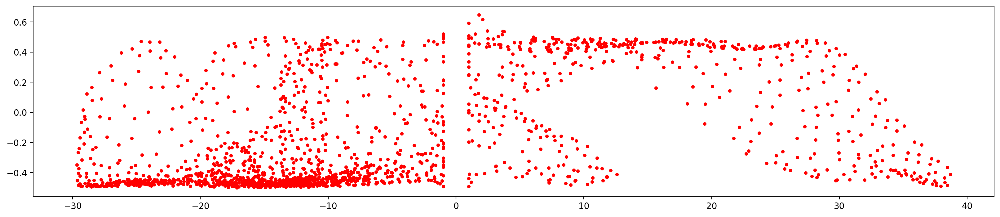

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:13
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:13
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:13
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 13 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:13
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:13
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:13
INFO: TOTAL TDES OOB 13 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:13
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:13
IN

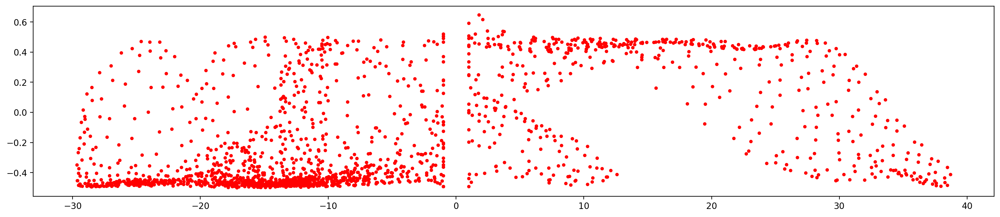

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:14
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:14
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:14
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 13 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:14
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:14
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:14
INFO: TOTAL TDES OOB 13 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:14
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:14
IN

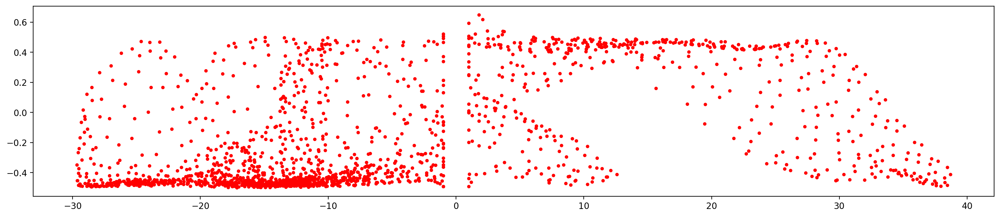

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:15
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:15
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:15
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 13 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:15
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:15
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:15
INFO: TOTAL TDES OOB 13 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:15
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:15
IN

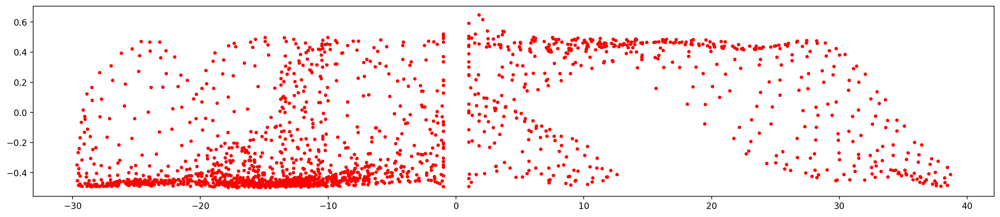

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:17
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:17
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:17
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 13 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:17
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:17
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:17
INFO: TOTAL TDES OOB 13 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:17
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:17
IN

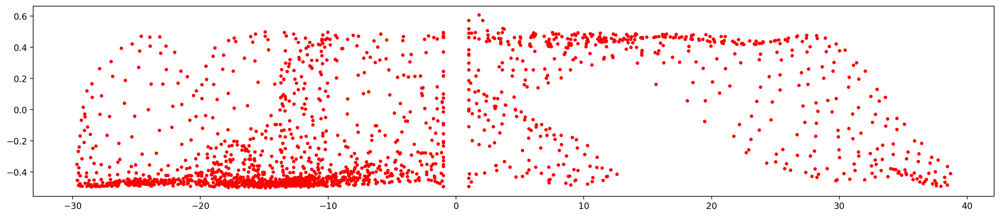

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:18
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:18
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:18
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 7 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:18
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:18
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:18
INFO: TOTAL TDES OOB 7 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:18
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:18
INFO

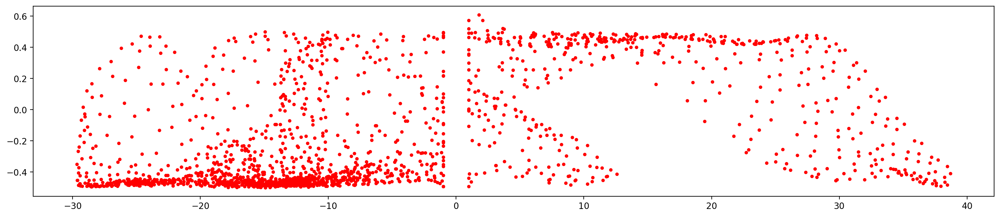

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:20
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:20
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:20
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 7 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:20
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:20
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:20
INFO: TOTAL TDES OOB 7 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:20
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:20
INFO

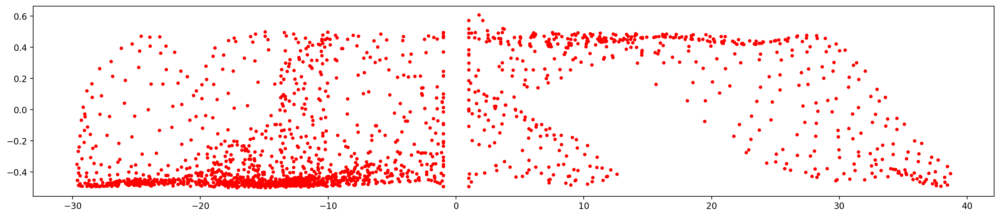

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:21
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:21
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:21
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 7 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:21
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:21
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:21
INFO: TOTAL TDES OOB 7 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:21
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:21
INFO

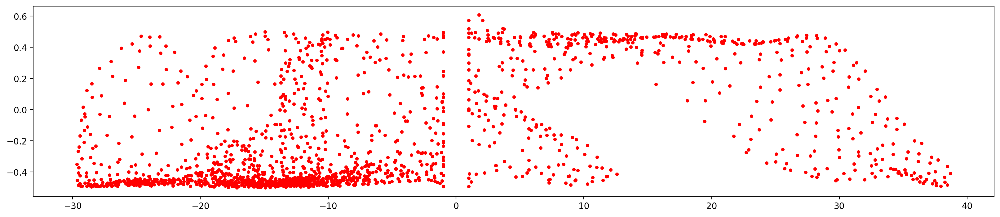

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:22
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:22
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:22
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 7 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:22
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:22
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:22
INFO: TOTAL TDES OOB 7 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:22
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:22
INFO

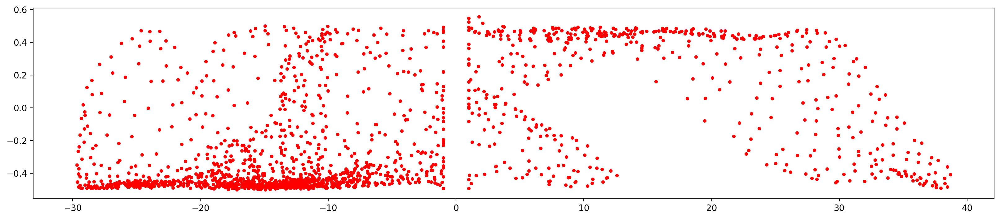

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:24
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:24
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:24
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 4 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:24
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:24
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:24
INFO: TOTAL TDES OOB 4 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:24
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:24
INFO

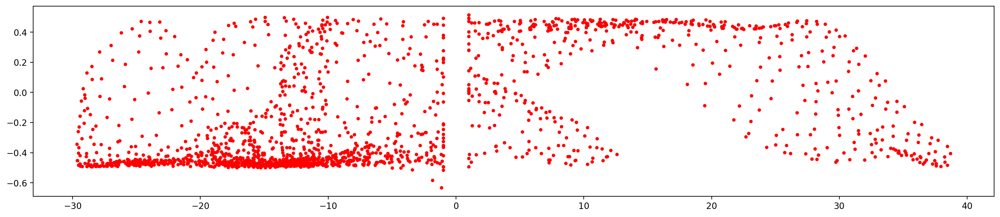

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:25
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:25
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 6 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:25
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:25
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:25
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:25
INFO: TOTAL TDES OOB 7 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:25
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:25
INFO

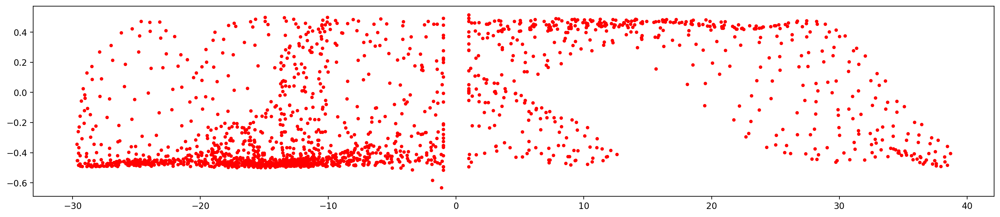

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:26
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:26
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 6 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:26
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:26
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:26
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:26
INFO: TOTAL TDES OOB 7 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:26
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:26
INFO

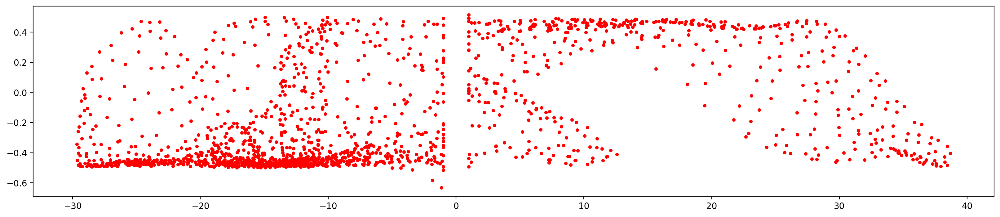

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:28
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:28
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 6 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:28
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:28
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:28
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:28
INFO: TOTAL TDES OOB 7 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:28
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:28
INFO

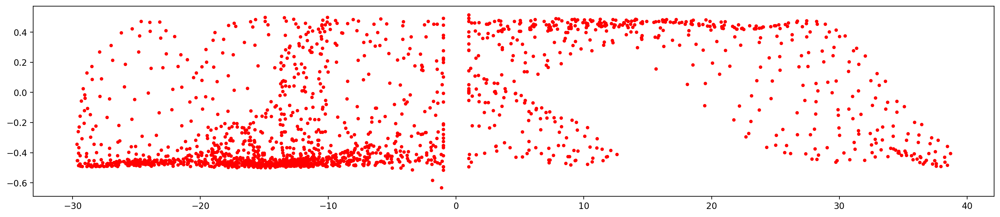

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:29
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:29
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 6 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:29
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:29
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:29
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:29
INFO: TOTAL TDES OOB 7 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:29
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:29
INFO

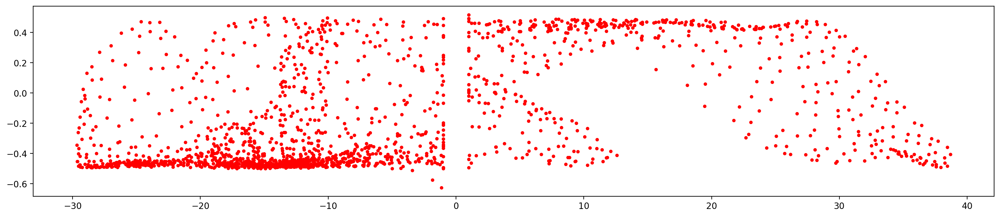

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:30
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:30
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 3 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:30
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:30
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:30
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:30
INFO: TOTAL TDES OOB 4 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:30
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:30
INFO

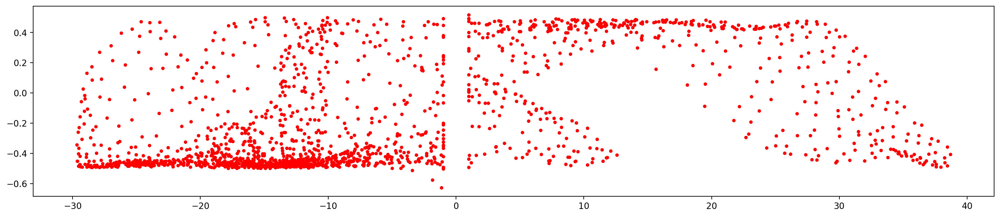

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:32
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:32
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 4 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:32
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:32
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:32
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:32
INFO: TOTAL TDES OOB 5 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:32
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:32
INFO

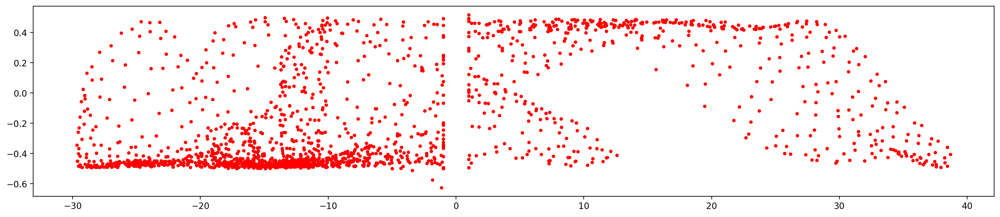

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:33
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:33
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 3 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:33
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:33
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:33
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:33
INFO: TOTAL TDES OOB 4 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:33
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:33
INFO

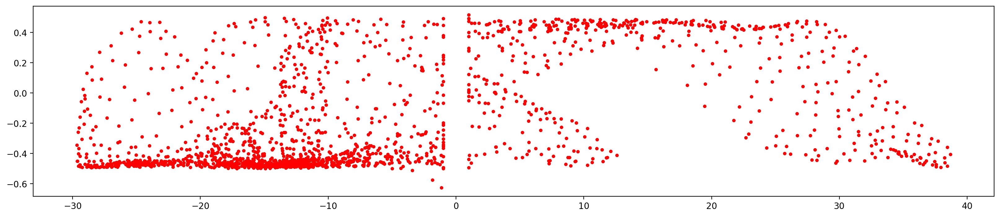

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:34
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:34
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 3 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:34
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:34
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:34
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:34
INFO: TOTAL TDES OOB 4 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:34
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:34
INFO

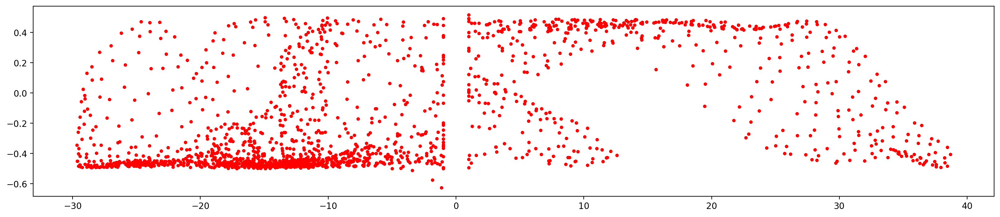

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:36
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:36
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 3 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:36
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:36
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:36
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:36
INFO: TOTAL TDES OOB 4 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:36
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:36
INFO

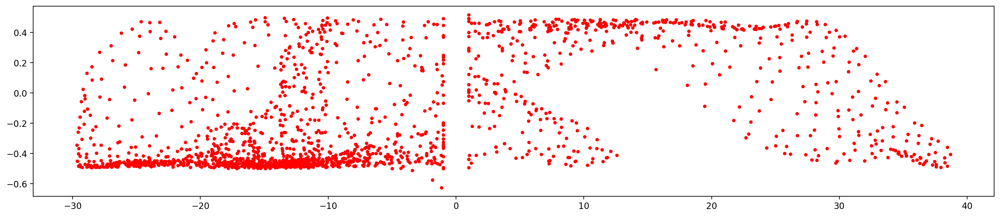

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:37
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:37
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 3 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:37
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:37
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:37
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:37
INFO: TOTAL TDES OOB 4 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:37
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:37
INFO

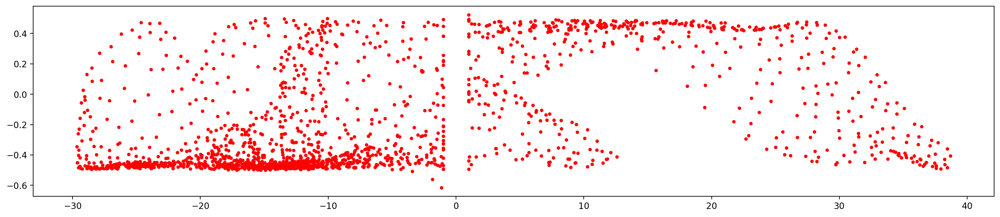

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:38
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:38
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 3 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:38
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:38
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:38
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:38
INFO: TOTAL TDES OOB 4 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:38
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:38
INFO

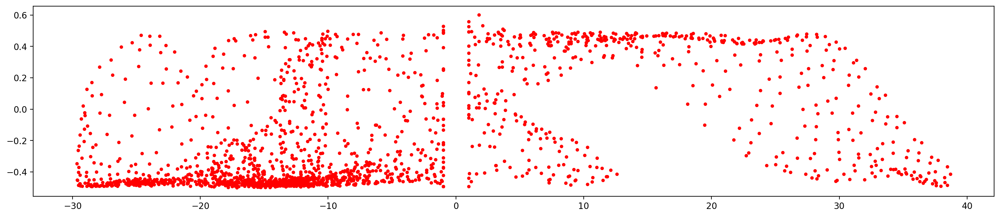

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:40
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:40
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:40
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 8 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:40
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:40
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:40
INFO: TOTAL TDES OOB 8 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:40
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:40
INFO

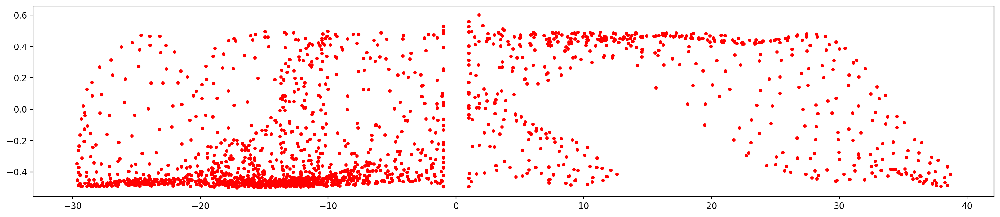

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:41
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:41
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:41
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 8 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:41
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:41
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:41
INFO: TOTAL TDES OOB 8 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:41
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:41
INFO

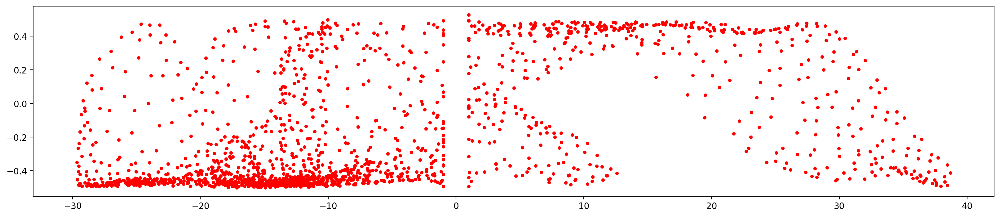

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:43
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:43
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:43
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 1 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:43
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:43
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:43
INFO: TOTAL TDES OOB 1 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:43
INFO: CONTINUE COUPLING RELAXATION ITERATION: True - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:43
INFO

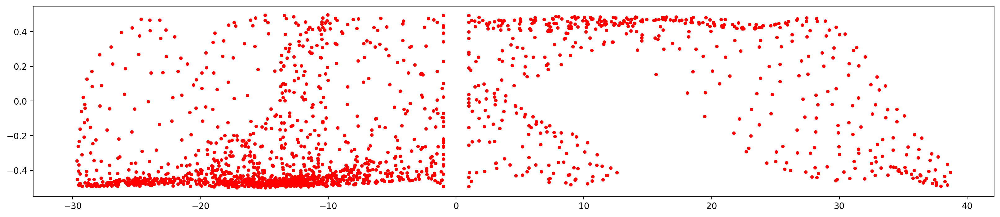

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:44
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:44
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:44
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:44
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:44
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:44
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:44
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:44
INF

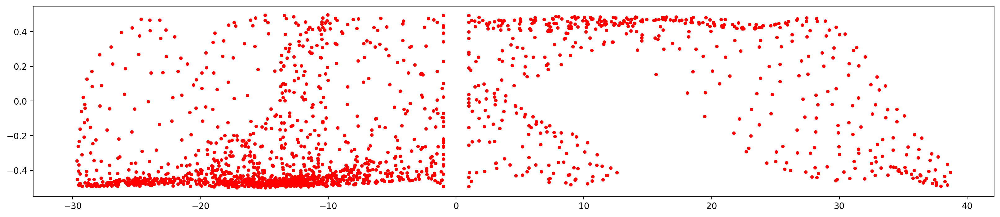

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:45
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:45
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:45
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:45
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:45
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:45
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:45
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:45
INF

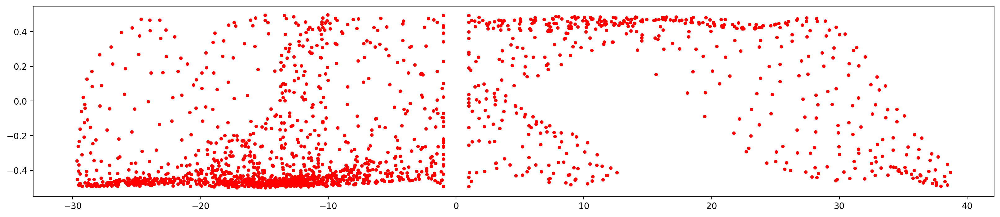

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:47
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:47
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:47
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:47
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:47
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:47
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:47
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:47
INF

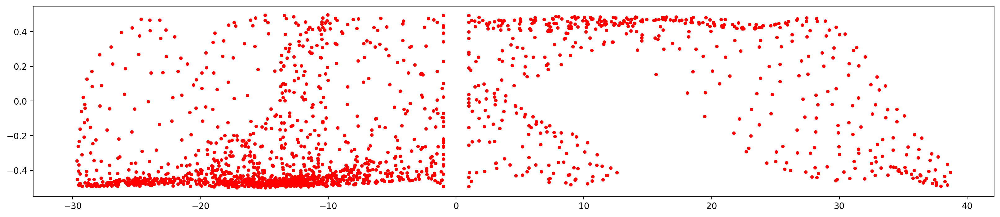

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:48
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:48
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:48
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:48
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:48
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:48
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:48
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:48
INF

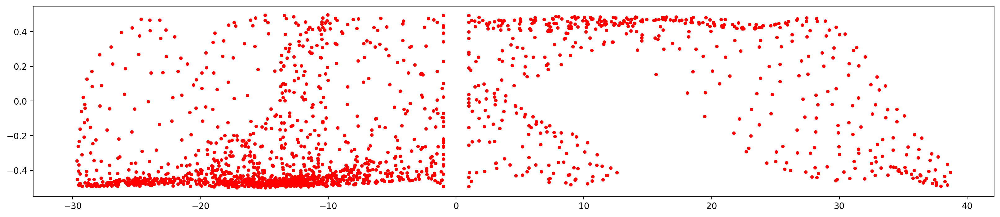

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:50
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:50
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:50
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:50
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:50
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:50
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:50
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:50
INF

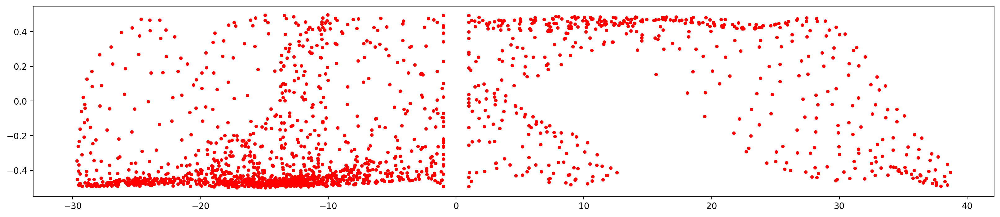

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:51
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:51
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:51
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:51
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:51
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:51
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:51
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:51
INF

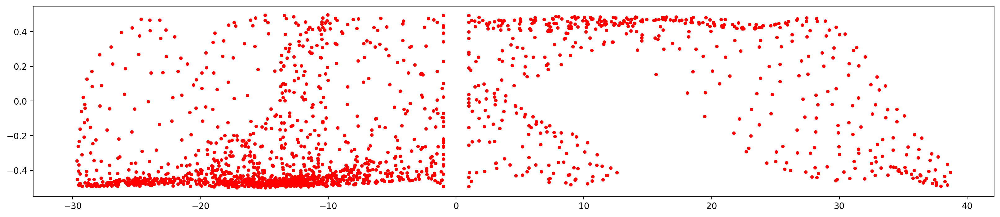

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:53
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:53
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:53
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:53
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:53
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:53
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:53
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:53
INF

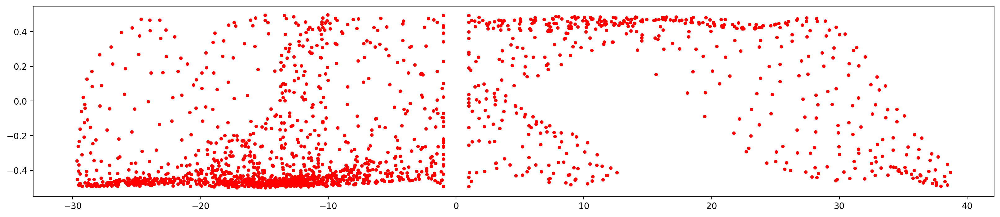

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:54
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:54
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:54
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:54
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:54
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:54
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:54
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:54
INF

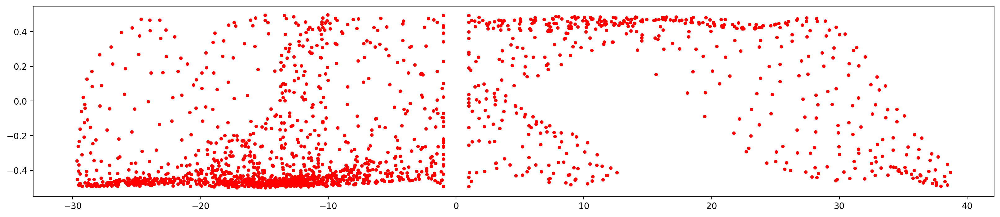

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:55
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:55
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:55
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:55
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:55
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:55
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:55
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:55
INF

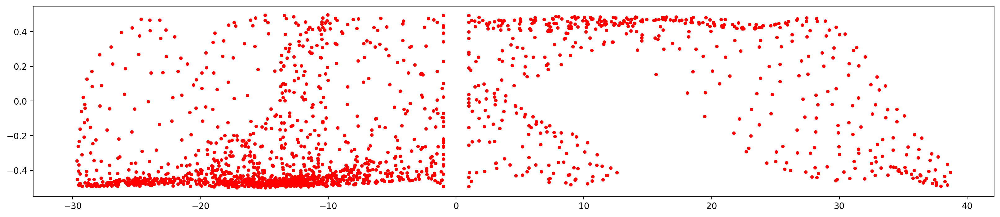

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:57
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:57
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:57
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:57
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:57
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:57
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:57
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:57
INF

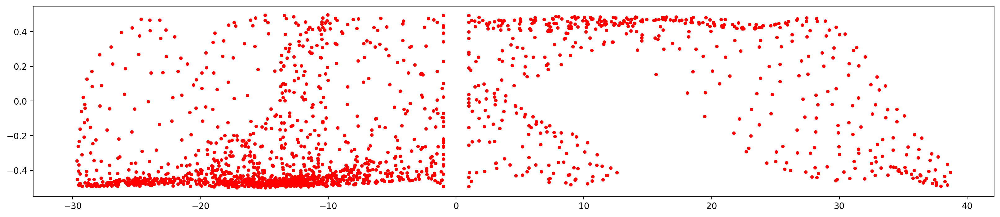

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:05:58
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:05:58
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:05:58
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:05:58
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:05:58
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:05:58
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:05:58
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:05:58
INF

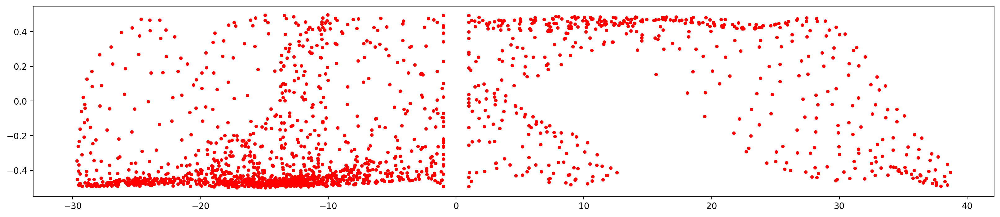

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:00
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:00
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:00
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:00
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:00
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:00
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:00
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:00
INF

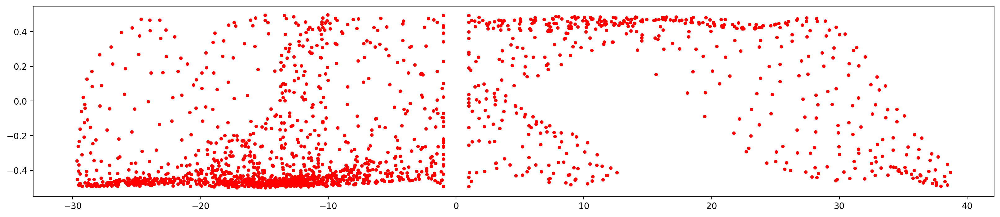

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:01
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:01
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:01
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:01
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:01
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:01
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:01
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:01
INF

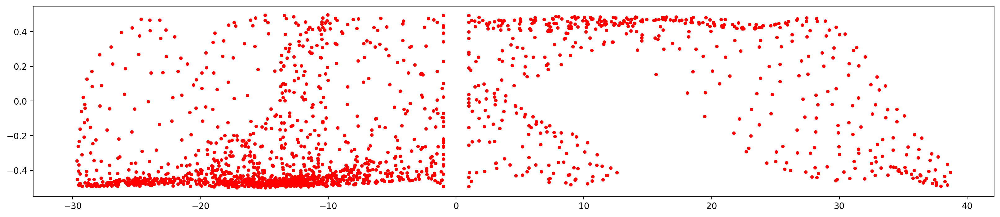

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:02
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:02
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:02
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:02
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:02
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:02
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:02
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:02
INF

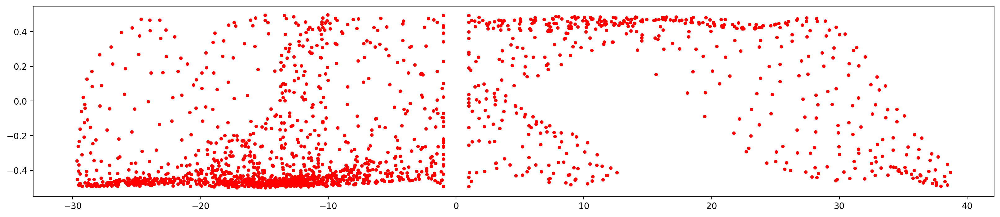

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:04
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:04
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:04
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:04
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:04
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:04
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:04
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:04
INF

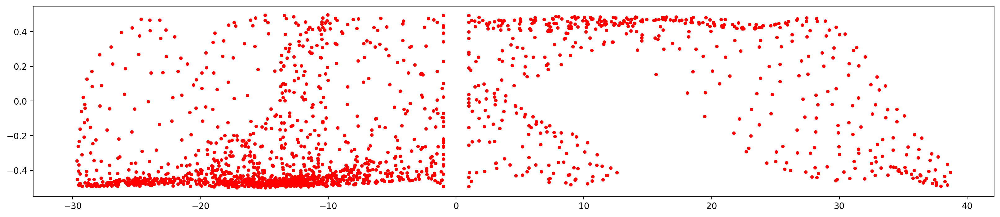

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:05
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:05
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:05
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:05
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:05
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:05
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:05
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:05
INF

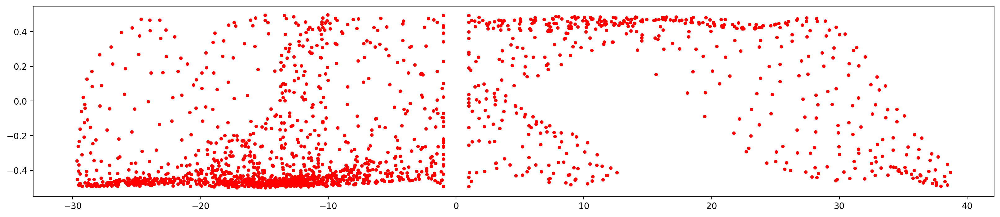

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:06
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:06
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:06
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:06
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:06
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:06
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:06
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:06
INF

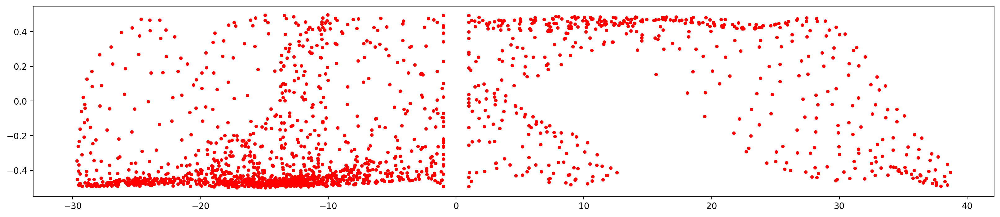

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:08
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:08
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:08
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:08
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:08
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:08
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:08
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:08
INF

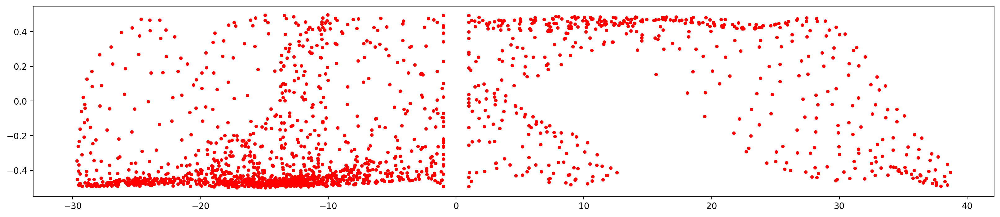

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:09
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:09
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:09
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:09
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:09
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:09
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:09
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:09
INF

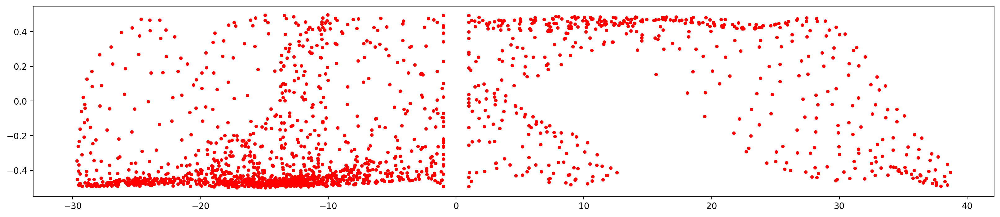

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:11
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:11
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:11
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:11
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:11
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:11
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:11
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:11
INF

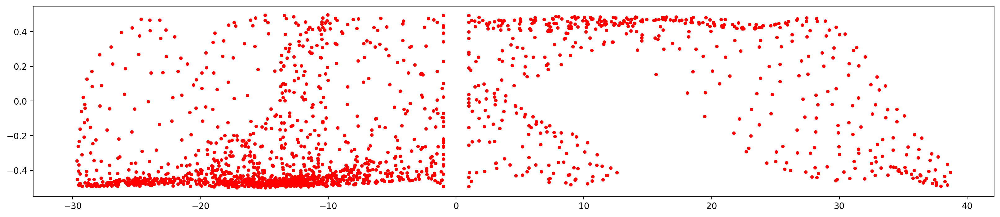

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:12
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:12
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:12
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:12
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:12
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:12
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:12
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:12
INF

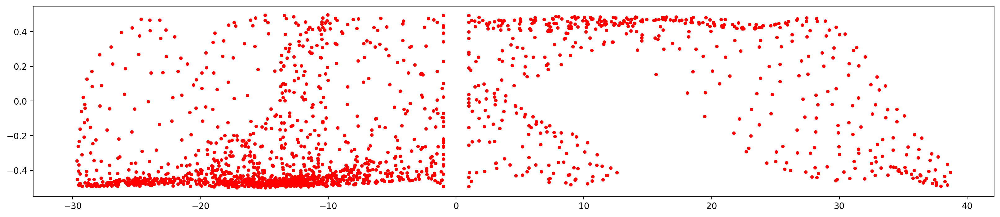

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:13
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:13
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:13
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:13
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:13
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:13
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:13
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:13
INF

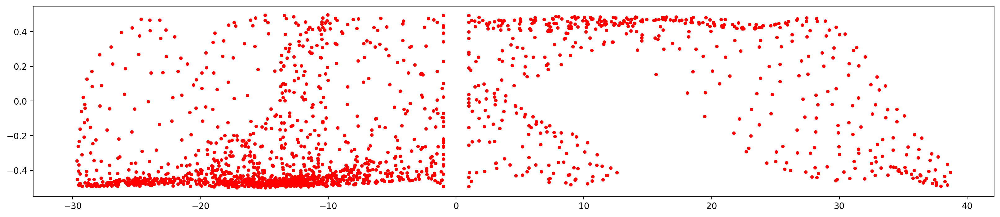

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:15
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:15
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:15
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:15
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:15
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:15
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:15
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:15
INF

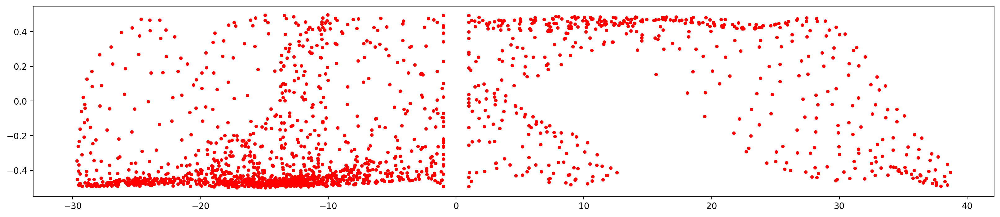

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:16
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:16
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:16
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:16
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:16
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:16
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:16
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:16
INF

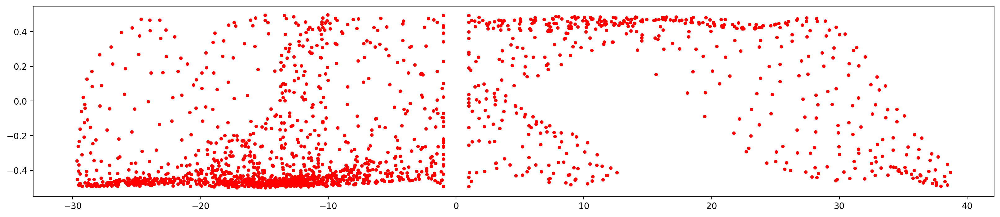

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:17
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:17
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:17
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:17
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:17
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:17
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:17
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:17
INF

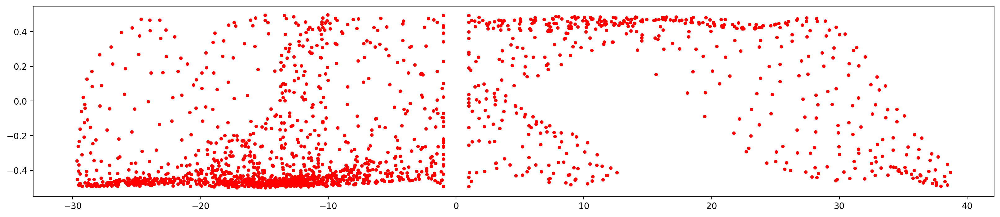

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:19
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:19
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:19
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:19
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:19
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:19
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:19
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:19
INF

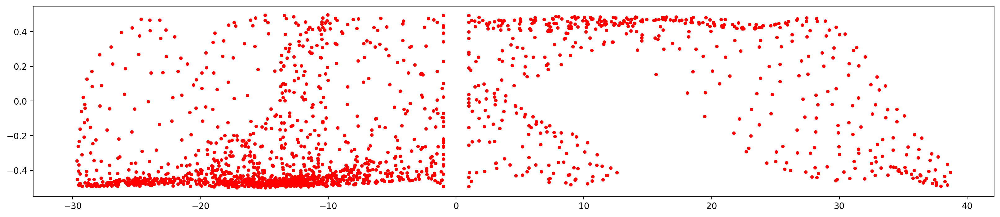

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:20
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:20
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:20
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:20
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:20
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:20
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:20
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:20
INF

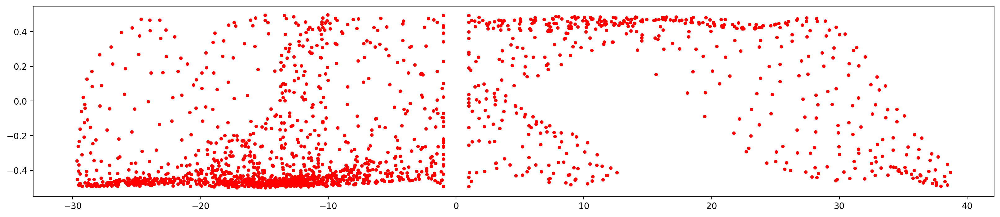

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:22
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:22
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:22
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:22
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:22
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:22
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:22
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:22
INF

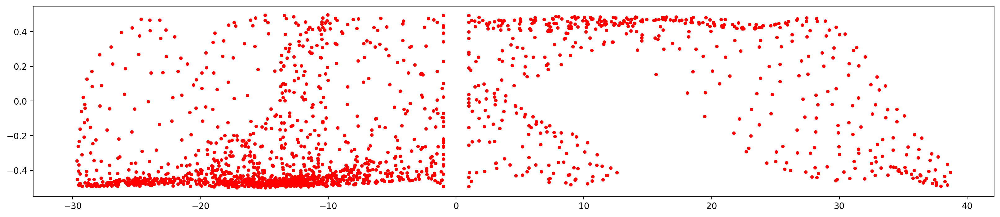

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:23
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:23
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:23
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:23
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:23
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:23
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:23
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:23
INF

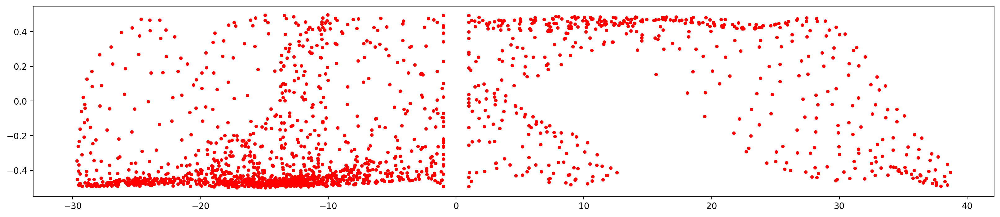

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:25
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:25
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:25
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:25
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:25
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:25
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:25
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:25
INF

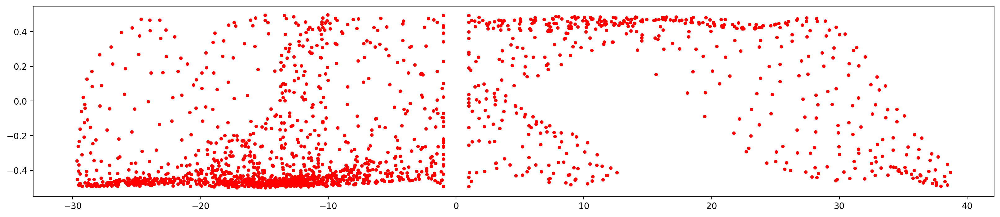

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:26
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:26
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:26
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:26
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:26
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:26
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:26
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:26
INF

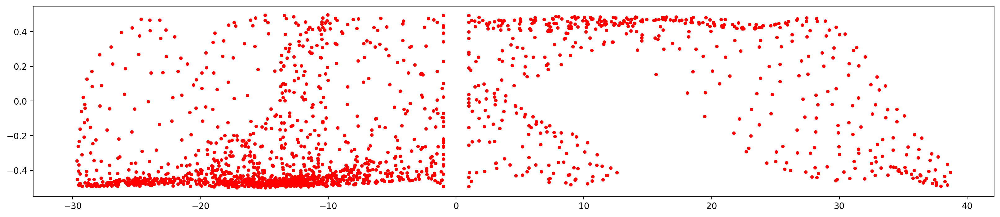

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:28
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:28
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:28
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:28
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:28
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:28
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:28
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:28
INF

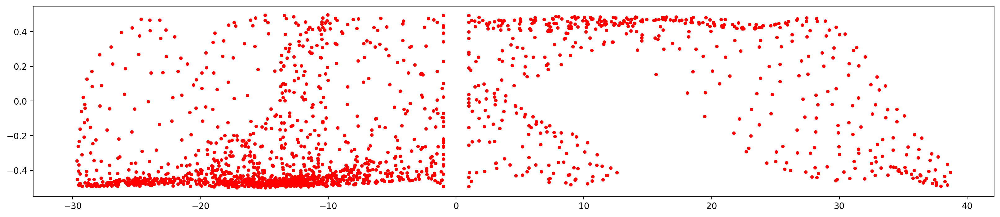

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:29
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:29
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:29
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:29
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:29
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:29
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:29
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:29
INF

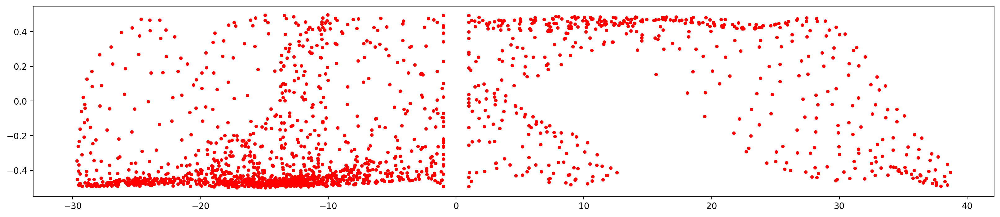

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:30
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:30
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:30
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:30
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:30
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:30
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:30
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:30
INF

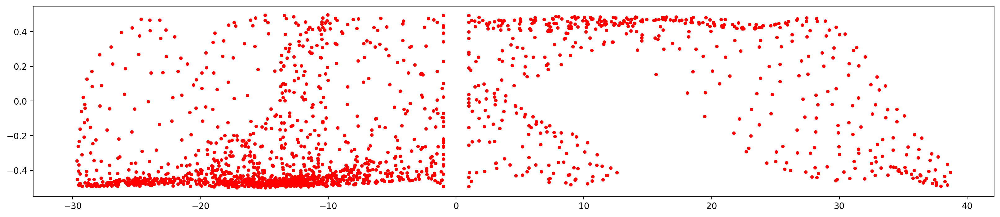

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:32
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:32
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:32
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:32
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:32
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:32
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:32
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:32
INF

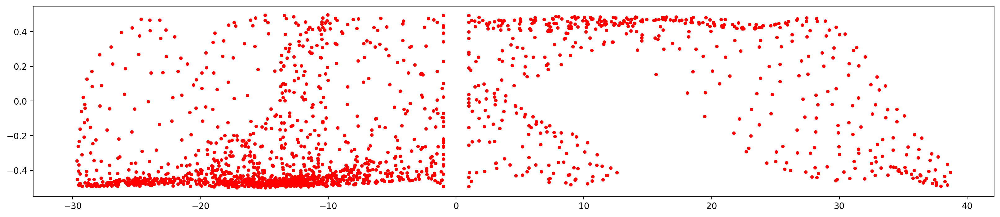

INFO: SS TDE COUPLING BOUNDS FOR MESH 0, min=-0.5, max=0.5 - __main__:check_coupling_bounds_single_mesh:153 - 2024-11-20 23:06:33
INFO: DS TDE COUPLING BOUNDS FOR MESH 0, min=0, max=1 - __main__:check_coupling_bounds_single_mesh:156 - 2024-11-20 23:06:33
INFO: MIN SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:161 - 2024-11-20 23:06:33
INFO: MAX SS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:164 - 2024-11-20 23:06:33
INFO: MIN DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:167 - 2024-11-20 23:06:33
INFO: MAX DS TDE COUPLING BOUNDS FOR MESH 0, OOB AT 0 TDEs - __main__:check_coupling_bounds_single_mesh:170 - 2024-11-20 23:06:33
INFO: TOTAL TDES OOB 0 TDEs - __main__:check_coupling_bounds_single_mesh:173 - 2024-11-20 23:06:33
INFO: CONTINUE COUPLING RELAXATION ITERATION: False - __main__:check_coupling_bounds_single_mesh:180 - 2024-11-20 23:06:33
INF

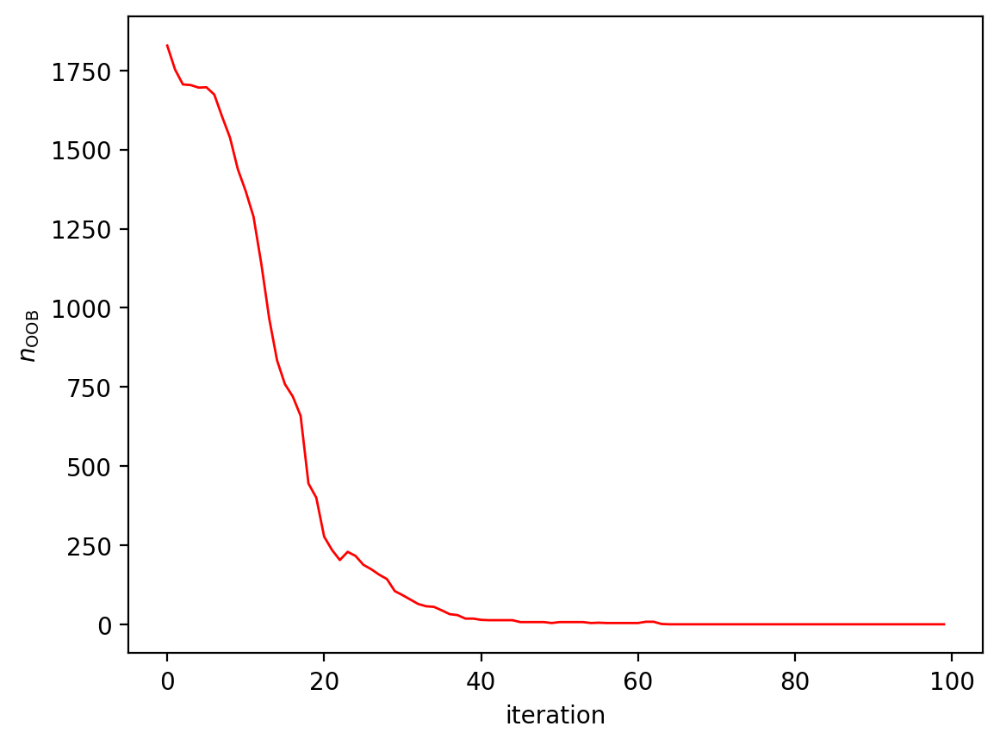

In [10]:
# Get total number of segment meshes
command.n_segment_meshes = np.max(segment.patch_file_name)

# # Get intial ("current") TDE slip rates for each segment mesh
# current_ss_bounds_lower = [np.array([])] * command.n_segment_meshes
# current_ss_bounds_upper = [np.array([])] * command.n_segment_meshes
# current_ds_bounds_lower = [np.array([])] * command.n_segment_meshes
# current_ds_bounds_upper = [np.array([])] * command.n_segment_meshes

# for i in range(command.n_segment_meshes):
#     current_ss_bounds_lower[i] = meshes[
#         i
#     ].qp_mesh_tde_slip_rate_lower_bound_ss * np.ones(meshes[i].n_tde)
#     current_ss_bounds_upper[i] = meshes[
#         i
#     ].qp_mesh_tde_slip_rate_upper_bound_ss * np.ones(meshes[i].n_tde)
#     current_ds_bounds_lower[i] = meshes[
#         i
#     ].qp_mesh_tde_slip_rate_lower_bound_ds * np.ones(meshes[i].n_tde)
#     current_ds_bounds_upper[i] = meshes[
#         i
#     ].qp_mesh_tde_slip_rate_upper_bound_ds * np.ones(meshes[i].n_tde)


current_ss_bounds_lower = meshes[0].qp_mesh_tde_slip_rate_lower_bound_ss * np.ones(
    meshes[0].n_tde
)
current_ss_bounds_upper = meshes[0].qp_mesh_tde_slip_rate_upper_bound_ss * np.ones(
    meshes[0].n_tde
)
current_ds_bounds_lower = meshes[0].qp_mesh_tde_slip_rate_lower_bound_ds * np.ones(
    meshes[0].n_tde
)
current_ds_bounds_upper = meshes[0].qp_mesh_tde_slip_rate_upper_bound_ds * np.ones(
    meshes[0].n_tde
)

# Start relaxation iterations
n_iter = 100
n_oob_vec = np.zeros(n_iter)
store_ss_lower = np.zeros((meshes[0].n_tde, n_iter))
store_ss_upper = np.zeros((meshes[0].n_tde, n_iter))
store_ds_lower = np.zeros((meshes[0].n_tde, n_iter))
store_ds_upper = np.zeros((meshes[0].n_tde, n_iter))
store_ss_jpl = np.zeros((meshes[0].n_tde, n_iter))
store_ss_bjm = np.zeros((meshes[0].n_tde, n_iter))
store_ds_jpl = np.zeros((meshes[0].n_tde, n_iter))
store_ds_bjm = np.zeros((meshes[0].n_tde, n_iter))


for i in range(n_iter):
    # Check bounds
    logger.info(f"\nITERATION {i}")
    (
        continue_iterate_for_coupling_bounds,
        updated_ss_bounds_lower,
        updated_ss_bounds_upper,
        updated_ds_bounds_lower,
        updated_ds_bounds_upper,
        kinematic_tde_rates_ss,
        kinematic_tde_rates_ds,
        estimated_tde_rates_ss,
        estimated_tde_rates_ds,
        n_oob,
    ) = check_coupling_bounds_single_mesh(
        meshes,
        0,  # This is the mesh index
        estimation_qp,
        current_ss_bounds_lower,
        current_ss_bounds_upper,
        current_ds_bounds_lower,
        current_ds_bounds_upper,
        debug_plot=False,
    )
    logger.info(f"{n_oob} TDEs with out of coupling bounds")

    # Store total number of OOB elements at this iteration step
    n_oob_vec[i] = n_oob

    # Build and insert update slip rate bounds into QP inequality vector
    updated_lower_bounds = -1.0 * celeri.interleave2(
        updated_ss_bounds_lower, updated_ds_bounds_lower
    )
    updated_upper_bounds = celeri.interleave2(
        updated_ss_bounds_upper, updated_ds_bounds_upper
    )
    updated_bounds = np.hstack((updated_lower_bounds, updated_upper_bounds))

    # Insert updated bounds into data vector for ineqaulity constraints
    updated_qp_inequality_constraints_data_vector = np.copy(
        qp_inequality_constraints_data_vector
    )
    updated_qp_inequality_constraints_data_vector[0 : len(updated_bounds)] = (
        updated_bounds
    )

    # QP solve with updated TDE slip rate constraints
    solution_qp = celeri.lsqlin_qp(
        operators.eigen * np.sqrt(weighting_vector_eigen[:, None]),
        data_vector_eigen * np.sqrt(weighting_vector_eigen),
        0,
        qp_inequality_constraints_matrix,  # Inequality matrix
        updated_qp_inequality_constraints_data_vector,  # Inequality data vector
        None,
        None,
        None,
        None,
        None,
        {"show_progress": False},
    )

    # Create estimation data structure and calculate derived quantities
    estimation_qp.state_vector = np.array(solution_qp["x"]).flatten()
    estimation_qp.operator = operators.eigen
    celeri.post_process_estimation_eigen(estimation_qp, operators, station, index)

    # Set *updated* to *current* for next iteration
    current_ss_bounds_lower = np.copy(updated_ss_bounds_lower)
    current_ss_bounds_upper = np.copy(updated_ss_bounds_upper)
    current_ds_bounds_lower = np.copy(updated_ds_bounds_lower)
    current_ds_bounds_upper = np.copy(updated_ds_bounds_upper)

    # Store values for understanding
    store_ss_lower[:, i] = current_ss_bounds_lower
    store_ss_upper[:, i] = current_ss_bounds_upper
    store_ds_lower[:, i] = current_ds_bounds_lower
    store_ds_upper[:, i] = current_ds_bounds_upper
    store_ss_bjm[:, i] = estimation_qp.tde_strike_slip_rates[0 : meshes[0].n_tde]
    store_ds_bjm[:, i] = estimation_qp.tde_dip_slip_rates[0 : meshes[0].n_tde]
    store_ss_jpl[:, i] = kinematic_tde_rates_ss
    store_ds_jpl[:, i] = kinematic_tde_rates_ds


# Plot convergence
plt.figure()
plt.plot(n_oob_vec, "-r", linewidth=1.0)
plt.xlabel("iteration")
plt.ylabel("$n_\mathrm{OOB}$")
plt.show()

In [11]:
estimation_qp.tde_strike_slip_rates[0 : meshes[0].n_tde]

array([-3.76016988, -3.44979776, -3.04493123, ..., -0.64684175,
        4.34872202,  4.72583165])

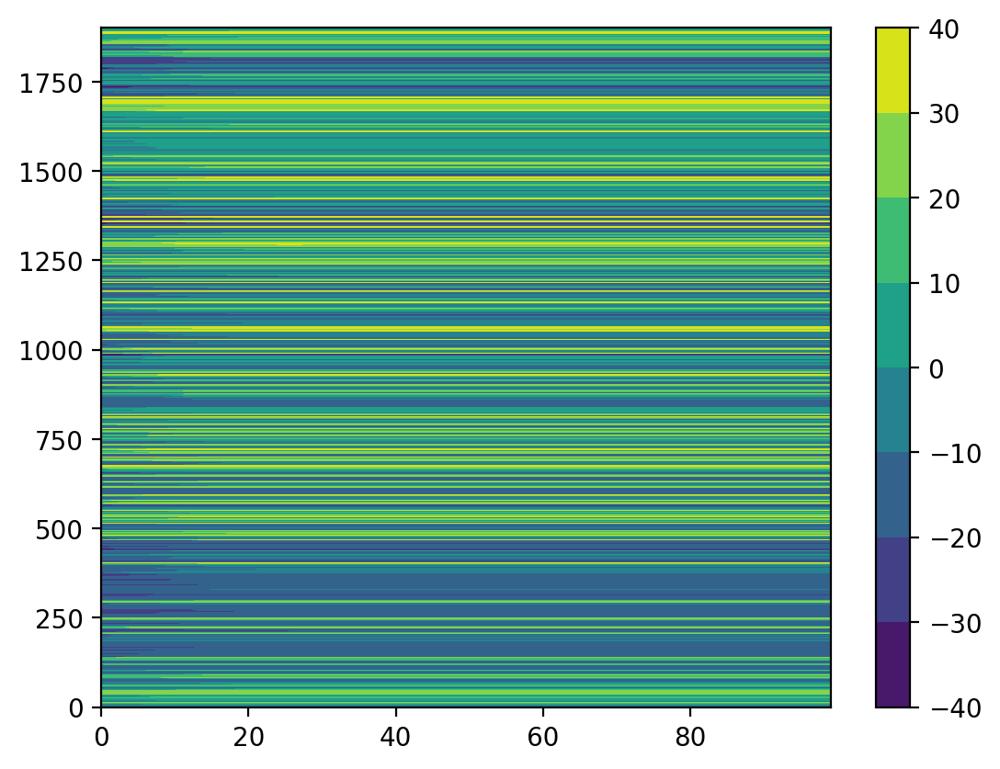

i=9
i=13
i=14
i=18
i=19
i=20
i=24
i=25
i=29
i=30
i=32
i=48
i=63
i=67
i=427
i=437
i=543
i=544
i=619
i=661
i=674
i=762
i=763
i=827
i=828
i=829
i=832
i=834
i=871
i=897
i=898
i=969
i=975
i=976
i=1030
i=1109
i=1110
i=1111
i=1199
i=1200
i=1404
i=1405
i=1406
i=1428
i=1430
i=1437
i=1438
i=1455
i=1456
i=1468
i=1512
i=1526
i=1527
i=1534
i=1537
i=1538
i=1539
i=1544
i=1548
i=1565
i=1566
i=1570
i=1571
i=1572
i=1579
i=1583
i=1584
i=1585
i=1586
i=1599
i=1600
i=1605
i=1615
i=1616
i=1643
i=1655
i=1662
i=1745
i=1751
i=1783
i=1826
i=1844
i=1846
i=1848
i=1849
i=1875


In [12]:
# Check for non-monotonic oscillations in bounds
array_to_check = store_ss_lower
for i in range(meshes[0].n_tde):
    is_monotonic_increasing = np.all(
        array_to_check[i, :][1:] >= array_to_check[i, :][:-1]
    )
    if not is_monotonic_increasing:
        print(i)

plt.figure()
plt.contourf(store_ss_jpl)
plt.colorbar()

plt.show()


for i in range(meshes[0].n_tde):
    sign_changes = np.where(
        np.sign(store_ss_jpl[i, :][:-1]) != np.sign(store_ss_jpl[i, :][1:])
    )[0]

    if len(sign_changes) > 0:
        print(f"{i=}")

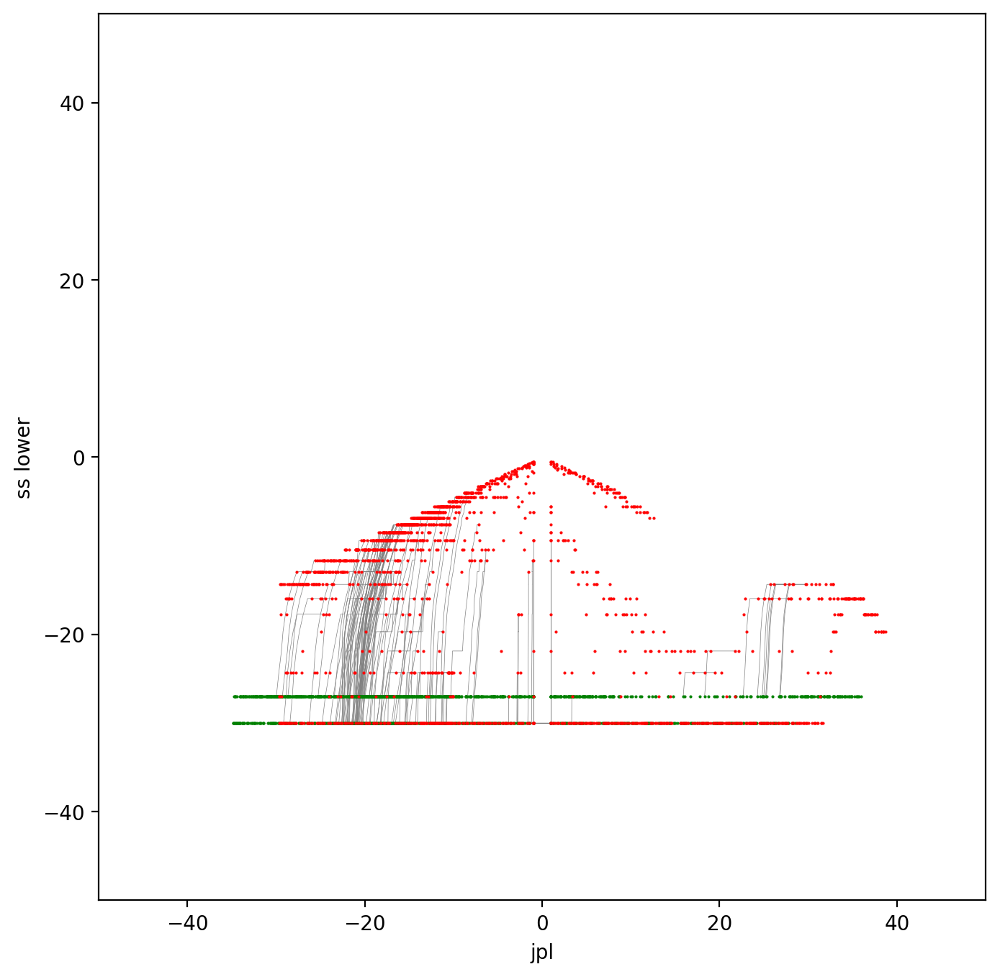

In [13]:
store_ss_lower.shape
n = meshes[0].n_tde
n = 200
plt.figure(figsize=(8, 8))
for i in range(n):
    plt.plot(
        store_ss_jpl[i, :],
        store_ss_lower[i, :],
        "-",
        linewidth=0.25,
        color="gray",
        zorder=1,
    )


plt.plot(
    store_ss_jpl[:, 0],
    store_ss_lower[:, 0],
    "g.",
    linewidth=0.25,
    markersize=1.0,
    zorder=1,
)


plt.plot(
    store_ss_jpl[:, -1],
    store_ss_lower[:, -1],
    "r.",
    linewidth=0.25,
    markersize=1.0,
    zorder=1,
)


# for i in range(n):
#     point_sizes = np.arange(1, len(store_ss_lower[i, :]) + 1) * 0.5
#     plt.scatter(
#         store_ss_jpl[i, :],
#         store_ss_lower[i, :],
#         s=point_sizes,
#         color="blue",
#         alpha=0.1,
#         zorder=2,
#     )

plt.xlim([-50, 50])
plt.ylim([-50, 50])
plt.gca().set_aspect("equal")
plt.xlabel("jpl")
plt.ylabel("ss lower")
plt.show()

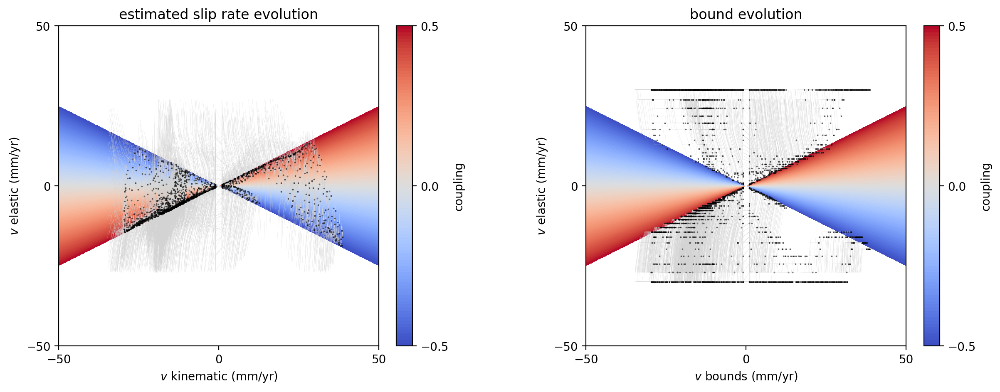

In [51]:
iters = np.array(range(len(store_ss_jpl[0, :])))
n = meshes[0].n_tde

levels = 101
j_cutoff = 50.0

j = np.linspace(-100, 100, 1000)
b = np.linspace(-100, 100, 1000)
j_grid, b_grid = np.meshgrid(j, b)
j_grid_orig = np.copy(j_grid)
b_grid_orig = np.copy(b_grid)


coupling_grid = b_grid / (j_grid)
coupling_grid[coupling_grid > 0.5] = np.nan
coupling_grid[coupling_grid < -0.5] = np.nan

# plt.figure()
# plt.contourf(j_grid_orig, b_grid_orig, coupling_grid, cmap="seismic", levels=levels)
# plt.colorbar(label="coupling")
# plt.xlabel("kinematic (mm/yr)")
# plt.ylabel("elastic (mm/yr)")
# plt.gca().set_aspect("equal")
# plt.gca().set_facecolor("lightgray")
# plt.show()


plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)

plt.contourf(j_grid_orig, b_grid_orig, coupling_grid, cmap="coolwarm", levels=levels)
plt.colorbar(label="coupling", fraction=0.046, pad=0.04, ticks=[-0.5, 0.0, 0.5])
# plt.xlabel("kinematic (mm/yr)")
# plt.ylabel("elastic (mm/yr)")
# plt.gca().set_aspect("equal")
# plt.gca().set_facecolor("lightgray")
# plt.show()


# for i in range(n):
#     # if not np.all(store_ss_lower[i, :] == store_ss_lower[i, :][0]):
#     #     if np.all(store_ss_lower[i, :][0] < 0):
#     line = colored_line_between_pts(
#         store_ss_jpl[i, :],
#         store_ss_bjm[i, :],
#         iters,
#         plt.gca(),
#         linewidth=0.1,
#         cmap="plasma_r",
#     )

for i in range(n):
    plt.plot(
        store_ss_jpl[i, :],
        store_ss_bjm[i, :],
        "-",
        linewidth=0.1,
        color="lightgray",
        zorder=1,
    )


# plt.plot(store_ss_jpl[:, 0], store_ss_bjm[:, 0], ".", markersize=0.5, color="lightgray")

plt.plot(store_ss_jpl[:, -1], store_ss_bjm[:, -1], ".k", markersize=0.5)
plt.xlim([-50, 50])
plt.ylim([-50, 50])
plt.xticks([-50, 0, 50])
plt.yticks([-50, 0, 50])
plt.gca().set_aspect("equal")
plt.xlabel("$v$ kinematic (mm/yr)")
plt.ylabel("$v$ elastic (mm/yr)")
plt.title("estimated slip rate evolution")

plt.subplot(1, 2, 2)
plt.contourf(j_grid_orig, b_grid_orig, coupling_grid, cmap="coolwarm", levels=levels)
plt.colorbar(label="coupling", fraction=0.046, pad=0.04, ticks=[-0.5, 0.0, 0.5])

# for i in range(n):
#     # if not np.all(store_ss_lower[i, :] == store_ss_lower[i, :][0]):
#     line = colored_line_between_pts(
#         store_ss_jpl[i, :],
#         store_ss_lower[i, :],
#         iters,
#         plt.gca(),
#         linewidth=0.1,
#         cmap="plasma_r",
#     )

#     line = colored_line_between_pts(
#         store_ss_jpl[i, :],
#         store_ss_upper[i, :],
#         iters,
#         plt.gca(),
#         linewidth=0.1,
#         cmap="plasma_r",
#     )


for i in range(n):
    plt.plot(
        store_ss_jpl[i, :],
        store_ss_lower[i, :],
        "-",
        linewidth=0.1,
        color="lightgray",
        zorder=1,
    )
    plt.plot(
        store_ss_jpl[i, :],
        store_ss_upper[i, :],
        "-",
        linewidth=0.1,
        color="lightgray",
        zorder=1,
    )

plt.plot(store_ss_jpl[:, -1], store_ss_lower[:, -1], ".k", markersize=0.5)
plt.plot(store_ss_jpl[:, -1], store_ss_upper[:, -1], ".k", markersize=0.5)

plt.xlim([-50, 50])
plt.ylim([-50, 50])
plt.xticks([-50, 0, 50])
plt.yticks([-50, 0, 50])
plt.gca().set_aspect("equal")
plt.xlabel("$v$ bounds (mm/yr)")
plt.ylabel("$v$ elastic (mm/yr)")
plt.title("bound evolution")

plt.show()

# Plot slip rate estimates vs bounds
- Check to make sure that we are always within bounds

In [15]:
start_idx = 500
end_idx = 1000

# Plot evolution of estimated slip rates and slip rate bounds
# start_idx = 500
# end_idx = 1000
# for i in range(n_iter):
#     plt.figure(figsize=(15, 3))
#     plt.plot(store_ss_lower[start_idx:end_idx, i], "-b", label="lower")
#     plt.plot(store_ss_upper[start_idx:end_idx, i], "-r", label="upper")
#     plt.plot(store_ss_bjm[start_idx:end_idx, i], "-k", label="estimated")
#     plt.title(f"{i=}")
#     plt.legend
#     plt.show()

# Print if slip rate bounds are being met
for i in range(n_iter):
    all_in_range_ss = np.all(
        (store_ss_bjm[:, i] > store_ss_lower[:, i])
        & (store_ss_bjm[:, i] < store_ss_upper[:, i])
    )
    all_in_range_ds = np.all(
        (store_ds_bjm[:, i] > store_ds_lower[:, i])
        & (store_ds_bjm[:, i] < store_ds_upper[:, i])
    )
    print(
        f"All strike-slip rates within bounds, {all_in_range_ss}, All dip-slip rates within bounds, {all_in_range_ds}"
    )

All strike-slip rates within bounds, True, All dip-slip rates within bounds, True
All strike-slip rates within bounds, True, All dip-slip rates within bounds, True
All strike-slip rates within bounds, True, All dip-slip rates within bounds, True
All strike-slip rates within bounds, True, All dip-slip rates within bounds, True
All strike-slip rates within bounds, True, All dip-slip rates within bounds, True
All strike-slip rates within bounds, True, All dip-slip rates within bounds, True
All strike-slip rates within bounds, True, All dip-slip rates within bounds, True
All strike-slip rates within bounds, True, All dip-slip rates within bounds, True
All strike-slip rates within bounds, True, All dip-slip rates within bounds, True
All strike-slip rates within bounds, True, All dip-slip rates within bounds, True
All strike-slip rates within bounds, True, All dip-slip rates within bounds, True
All strike-slip rates within bounds, True, All dip-slip rates within bounds, True
All strike-slip 

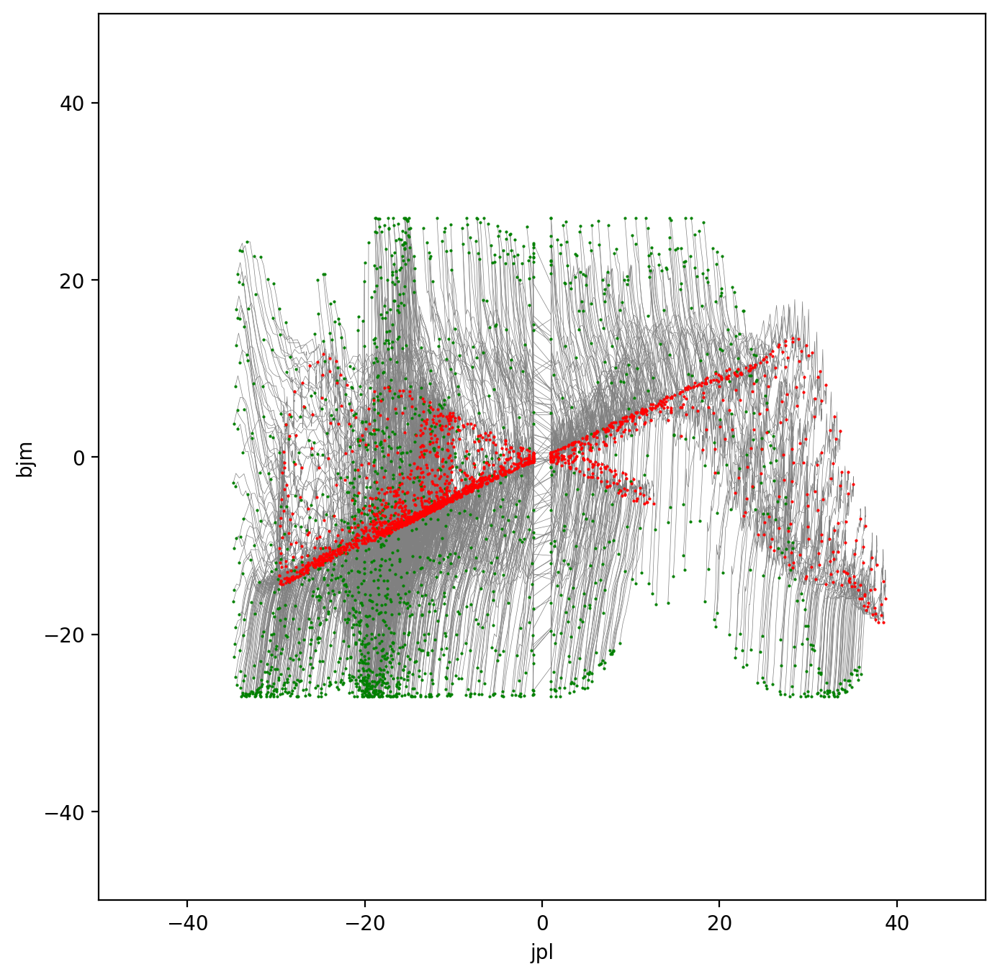

In [16]:
n = meshes[0].n_tde
# n = 100
plt.figure(figsize=(8, 8))
for i in range(n):
    plt.plot(
        store_ss_jpl[i, :],
        store_ss_bjm[i, :],
        "-",
        linewidth=0.25,
        color="gray",
        zorder=1,
    )

plt.plot(
    store_ss_jpl[:, 0],
    store_ss_bjm[:, 0],
    "g.",
    linewidth=0.25,
    markersize=1.0,
    zorder=1,
)

plt.plot(
    store_ss_jpl[:, -1],
    store_ss_bjm[:, -1],
    "r.",
    linewidth=0.25,
    markersize=1.0,
    zorder=1,
)

# for i in range(n):
#     point_sizes = np.arange(1, len(store_ss_jpl[i, :]) + 1) * 0.5
#     plt.scatter(
#         store_ss_jpl[i, :],
#         store_ss_bjm[i, :],
#         s=point_sizes,
#         color="blue",
#         alpha=0.1,
#         zorder=2,
#     )

plt.xlim([-50, 50])
plt.ylim([-50, 50])
plt.gca().set_aspect("equal")
plt.xlabel("jpl")
plt.ylabel("bjm")
plt.show()

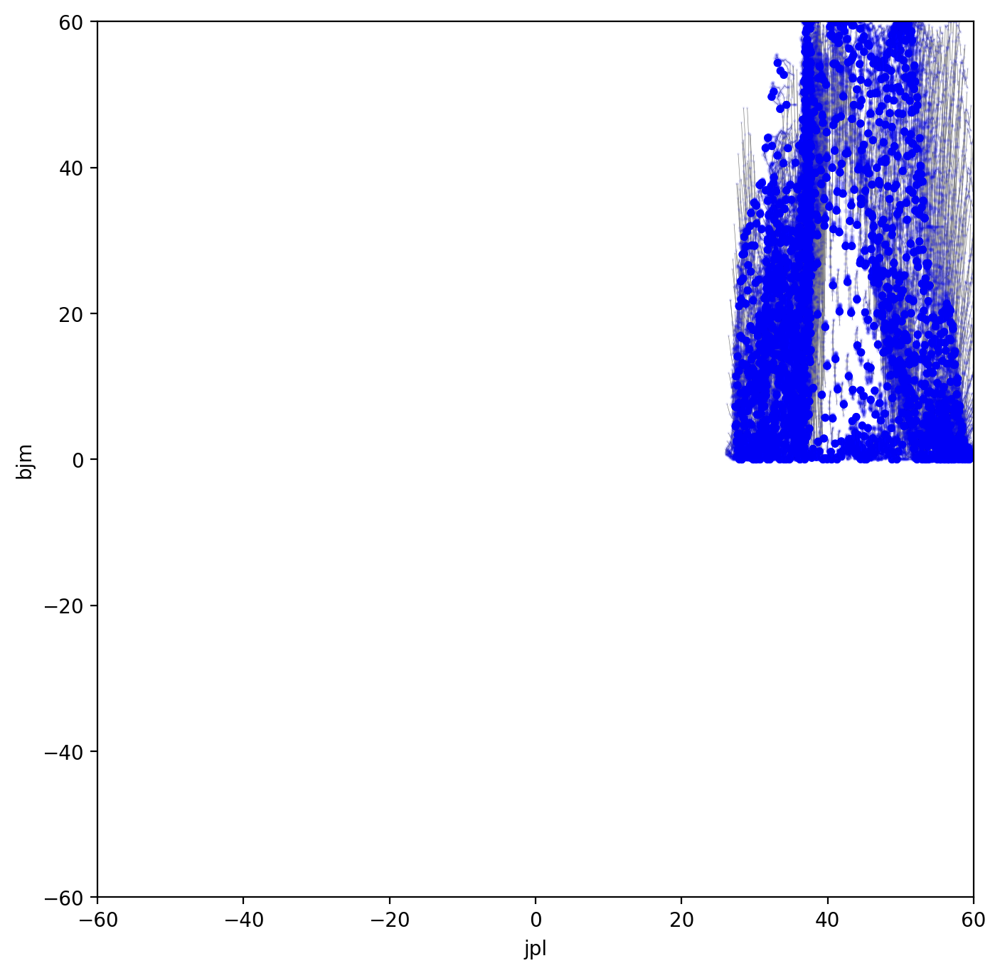

In [17]:
plt.figure(figsize=(8, 8))
for i in range(meshes[0].n_tde):
    plt.plot(
        store_ds_jpl[i, :],
        store_ds_bjm[i, :],
        "-",
        linewidth=0.25,
        color="gray",
        zorder=1,
    )

for i in range(meshes[0].n_tde):
    point_sizes = np.arange(1, len(store_ds_jpl[i, :]) + 1) * 0.1
    plt.scatter(
        store_ds_jpl[i, :],
        store_ds_bjm[i, :],
        s=point_sizes,
        color="blue",
        alpha=0.1,
        zorder=2,
    )

plt.xlim([-60, 60])
plt.ylim([-60, 60])
plt.gca().set_aspect("equal")
plt.xlabel("jpl")
plt.ylabel("bjm")
plt.show()

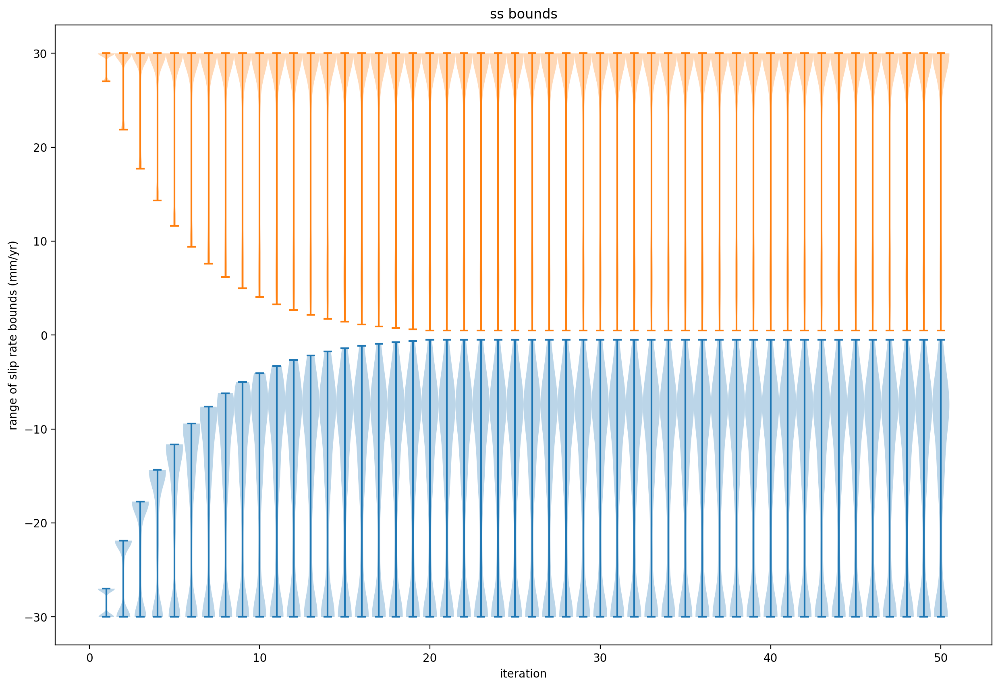

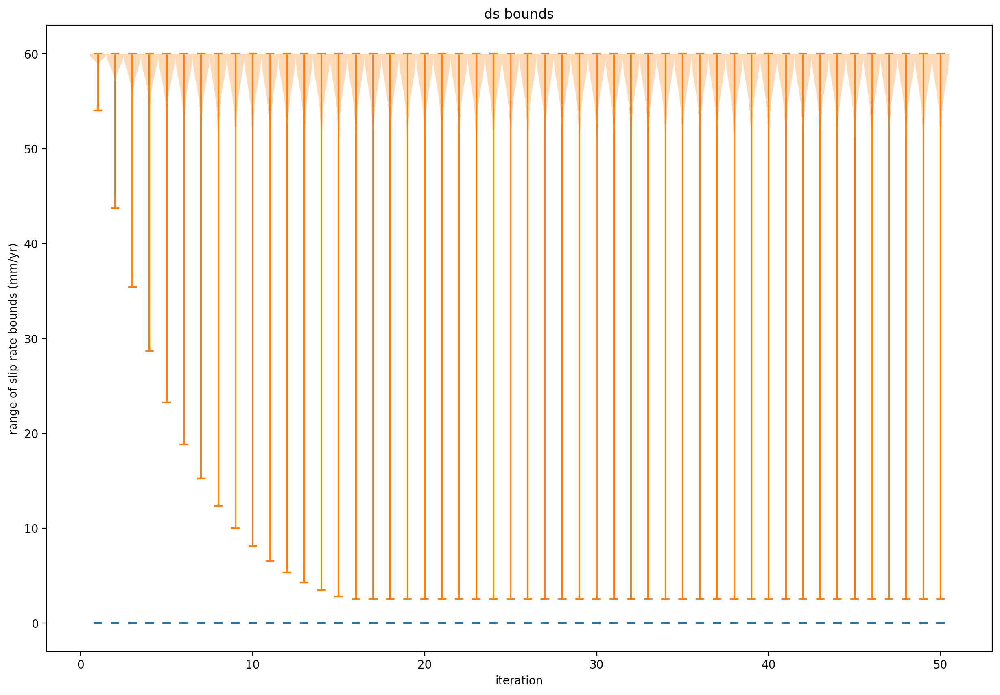

In [18]:
plt.figure(figsize=(15, 10))
plt.violinplot(store_ss_lower[:, 0::2], showmeans=False, showmedians=False, widths=1.0)
plt.violinplot(store_ss_upper[:, 0::2], showmeans=False, showmedians=False, widths=1.0)
plt.xlabel("iteration")
plt.ylabel("range of slip rate bounds (mm/yr)")
plt.title("ss bounds")
plt.show()

plt.figure(figsize=(15, 10))
plt.violinplot(store_ds_lower[:, 0::2], showmeans=False, showmedians=False, widths=1.0)
plt.violinplot(store_ds_upper[:, 0::2], showmeans=False, showmedians=False, widths=1.0)
plt.xlabel("iteration")
plt.ylabel("range of slip rate bounds (mm/yr)")
plt.title("ds bounds")
plt.show()

# Plot complete model result after coupling iterations

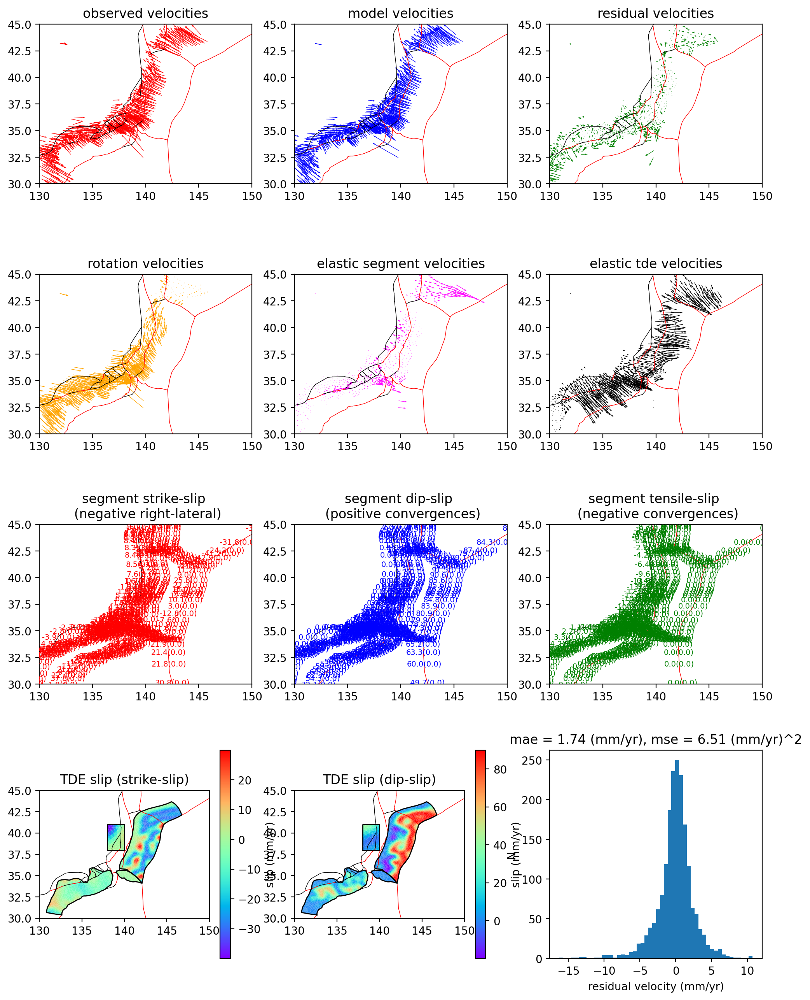

SUCCESS: Wrote figures../runs/0000000564/plot_estimation_summary.(pdf, png) - celeri.celeri:plot_estimation_summary:6601 - 2024-11-20 23:06:54


<Figure size 640x480 with 0 Axes>

In [19]:
celeri.plot_estimation_summary(
    command,
    segment,
    station,
    meshes,
    estimation_qp,
    lon_range=command.lon_range,
    lat_range=command.lat_range,
    quiver_scale=command.quiver_scale,
)

# Plot final slip rates and coupling distributions

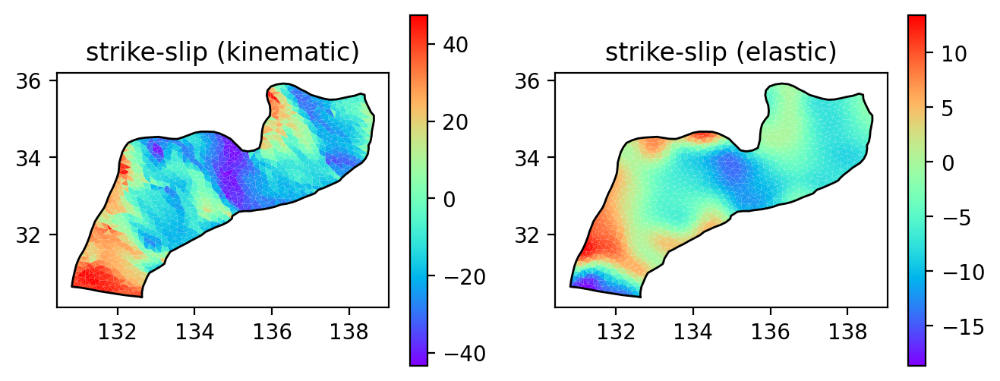

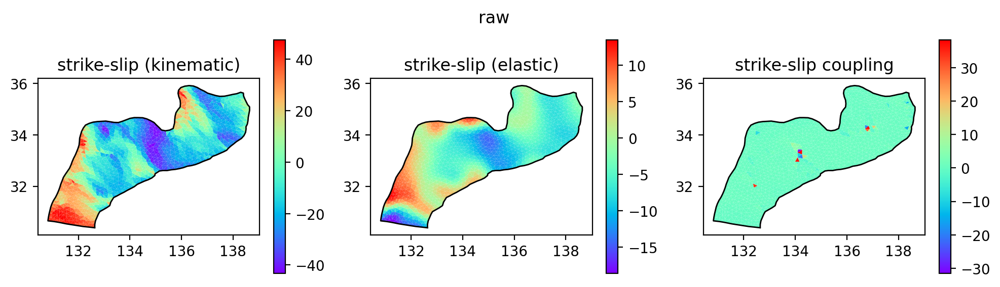

In [20]:
# Multiply rotation vector components by TDE slip rate partials
jpl = (
    operators.rotation_to_tri_slip_rate[0]
    @ estimation_qp.state_vector[0 : 3 * len(block)]
)

# Multiply eigen modes by eigen to TDE matrix
bjm = (
    operators.eigenvectors_to_tde_slip[0]
    @ estimation_qp.state_vector[
        3 * len(block) : 3 * len(block)
        + meshes[0].n_modes_strike_slip
        + meshes[0].n_modes_dip_slip
    ]
)

plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[0::2], plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")


# Smooth kinematic smooth
jpl_ss_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[0::2], length_scale=0.01
)

jpl_ds_smooth = smooth_irregular_data(
    meshes[0].lon_centroid, meshes[0].lat_centroid, jpl[1::2], length_scale=0.01
)

jpl_ss_smooth[np.abs(jpl_ss_smooth) < 5.0] = 5.0

coupling_ss = bjm[0::2] / np.abs(jpl_ss_smooth)

plt.figure(figsize=(12, 3))
plt.subplot(1, 3, 1)
plot_mesh(meshes[0], jpl[0::2], plt.gca())
plt.title("strike-slip (kinematic)")

plt.subplot(1, 3, 2)
plot_mesh(meshes[0], bjm[0::2], plt.gca())
plt.title("strike-slip (elastic)")

plt.subplot(1, 3, 3)
plot_mesh(meshes[0], bjm[0::2] / jpl[0::2], plt.gca())
plt.title("strike-slip coupling")
plt.suptitle("raw")
plt.show()

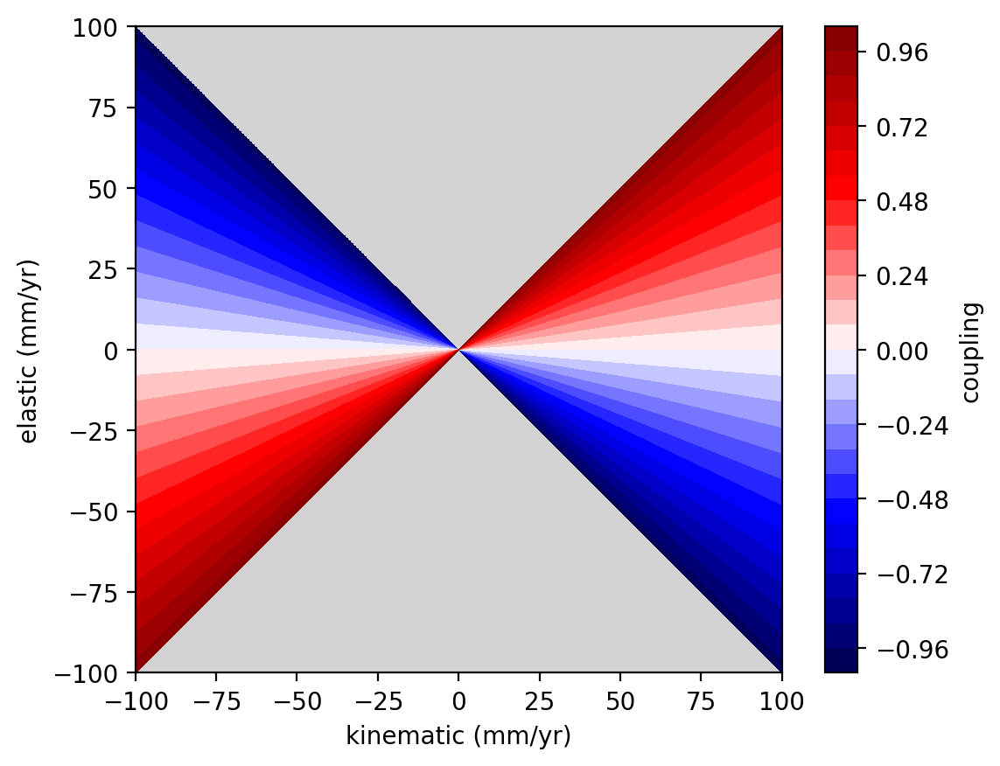

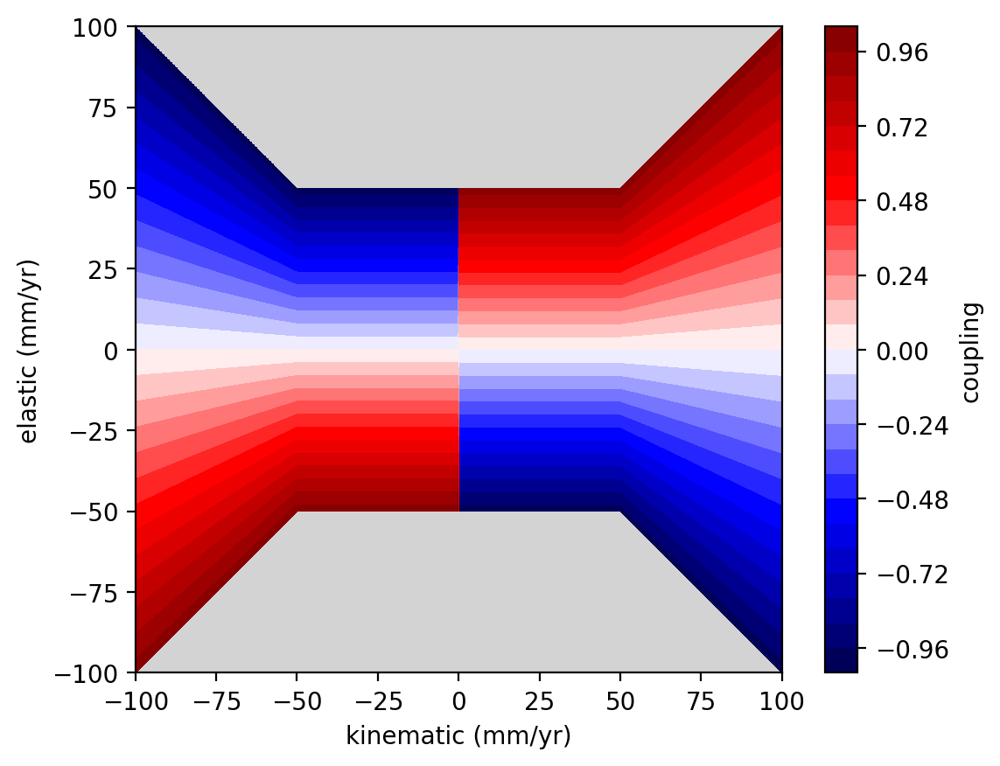

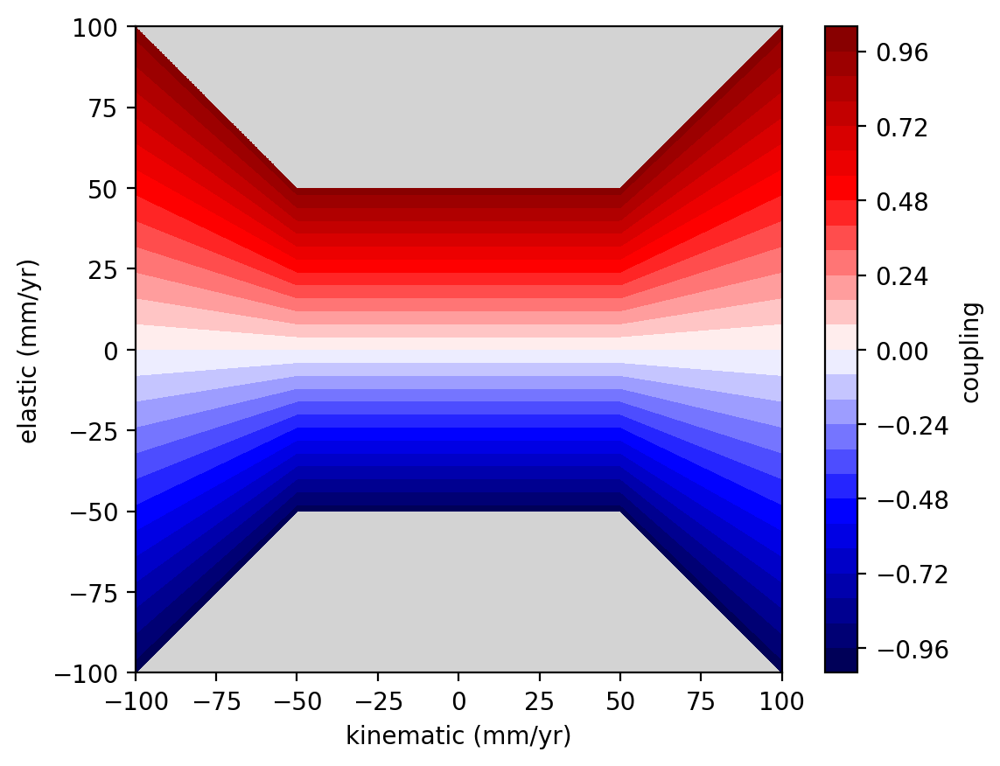

In [21]:
levels = 31
j_cutoff = 50.0

j = np.linspace(-100, 100, 1000)
b = np.linspace(-100, 100, 1000)
j_grid, b_grid = np.meshgrid(j, b)
j_grid_orig = np.copy(j_grid)
b_grid_orig = np.copy(b_grid)


coupling_grid = b_grid / (j_grid)
coupling_grid[coupling_grid > 1] = np.nan
coupling_grid[coupling_grid < -1] = np.nan

plt.figure()
plt.contourf(j_grid_orig, b_grid_orig, coupling_grid, cmap="seismic", levels=levels)
plt.colorbar(label="coupling")
plt.xlabel("kinematic (mm/yr)")
plt.ylabel("elastic (mm/yr)")
plt.gca().set_aspect("equal")
plt.gca().set_facecolor("lightgray")
plt.show()


j = np.linspace(-100, 100, 1000)
j[np.abs(j) < j_cutoff] = np.sign(j[np.abs(j) < j_cutoff]) * j_cutoff
b = np.linspace(-100, 100, 1000)
j_grid, b_grid = np.meshgrid(j, b)
coupling_grid = b_grid / j_grid
coupling_grid[coupling_grid > 1] = np.nan
coupling_grid[coupling_grid < -1] = np.nan
plt.figure()
plt.contourf(j_grid_orig, b_grid_orig, coupling_grid, cmap="seismic", levels=levels)
plt.colorbar(label="coupling")
plt.xlabel("kinematic (mm/yr)")
plt.ylabel("elastic (mm/yr)")
plt.gca().set_aspect("equal")
plt.gca().set_facecolor("lightgray")
plt.show()

coupling_grid = b_grid / np.abs(j_grid)
coupling_grid[coupling_grid > 1] = np.nan
coupling_grid[coupling_grid < -1] = np.nan
plt.figure()
plt.contourf(j_grid_orig, b_grid_orig, coupling_grid, cmap="seismic", levels=levels)
plt.colorbar(label="coupling")
plt.xlabel("kinematic (mm/yr)")
plt.ylabel("elastic (mm/yr)")
plt.gca().set_aspect("equal")
plt.gca().set_facecolor("lightgray")
plt.show()